# ETL y EDA

## Librerías Utilizadas


In [81]:
import pandas as pd
import numpy as np
from ydata_profiling import ProfileReport

import warnings 
warnings.filterwarnings("ignore")

import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import seaborn as sns

import geopandas as gpd
import contextily as ctx

Se cargan los archivos.

In [82]:
df_hechos= pd.read_excel('..\\datasets\\1. Originales\\homicidios.xlsx', sheet_name='HECHOS')
df_victimas= pd.read_excel('..\\datasets\\1. Originales\\homicidios.xlsx', sheet_name='VICTIMAS')

In [83]:
df_hechos.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 696 entries, 0 to 695
Data columns (total 21 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   ID                     696 non-null    object        
 1   N_VICTIMAS             696 non-null    int64         
 2   FECHA                  696 non-null    datetime64[ns]
 3   AAAA                   696 non-null    int64         
 4   MM                     696 non-null    int64         
 5   DD                     696 non-null    int64         
 6   HORA                   696 non-null    object        
 7   HH                     696 non-null    object        
 8   LUGAR_DEL_HECHO        696 non-null    object        
 9   TIPO_DE_CALLE          696 non-null    object        
 10  Calle                  695 non-null    object        
 11  Altura                 129 non-null    float64       
 12  Cruce                  525 non-null    object        
 13  Direc

Se normalizan los nombres de las columnas.

In [84]:
df_hechos.columns

Index(['ID', 'N_VICTIMAS', 'FECHA', 'AAAA', 'MM', 'DD', 'HORA', 'HH',
       'LUGAR_DEL_HECHO', 'TIPO_DE_CALLE', 'Calle', 'Altura', 'Cruce',
       'Dirección Normalizada', 'COMUNA', 'XY (CABA)', 'pos x', 'pos y',
       'PARTICIPANTES', 'VICTIMA', 'ACUSADO'],
      dtype='object')

In [85]:
# Modifico los nombres al tipo "Oración" y quito los guiones bajos.
df_hechos.columns = df_hechos.columns.str.strip().str.capitalize().str.replace('_',' ')
# Renombro algunas columnas específicamente
df_hechos.rename(columns={'N victimas':'Cantidad de victimas','Aaaa': 'Año','Mm': 'Mes','Dd': 'Día','Hh': 'HH','Xy (caba)': 'xy'}, inplace=True)
df_hechos.columns

Index(['Id', 'Cantidad de victimas', 'Fecha', 'Año', 'Mes', 'Día', 'Hora',
       'HH', 'Lugar del hecho', 'Tipo de calle', 'Calle', 'Altura', 'Cruce',
       'Dirección normalizada', 'Comuna', 'xy', 'Pos x', 'Pos y',
       'Participantes', 'Victima', 'Acusado'],
      dtype='object')

In [86]:
df_victimas.columns

Index(['ID_hecho', 'FECHA', 'AAAA', 'MM', 'DD', 'ROL', 'VICTIMA', 'SEXO',
       'EDAD', 'FECHA_FALLECIMIENTO'],
      dtype='object')

In [87]:
# Modifico los nombres al tipo "Oración" y quito los guiones bajos.
df_victimas.columns = df_victimas.columns.str.strip().str.capitalize().str.replace('_',' ')

# Renombro algunas columnas específicamente y modifico el nombre del Id para que coincida con la tabla de Hechos
df_victimas.rename(columns={'Id hecho': 'Id','Aaaa': 'Año','Mm': 'Mes','Dd': 'Día'}, inplace=True)
df_victimas.columns

Index(['Id', 'Fecha', 'Año', 'Mes', 'Día', 'Rol', 'Victima', 'Sexo', 'Edad',
       'Fecha fallecimiento'],
      dtype='object')

---
---
# Tabla de Hechos.
Se crea un primer reporte mínmo para el análisis de tipos de datos y elementos nulos elaborando el ProfileReport adjunto.

---
## Reporte Mínimo: Tabla de Hechos

In [88]:
profile = ProfileReport(df_hechos, title="EDA de Hechos", minimal=True)
profile.to_file('..\\ProfileReports\\' + "ProfileReport_Hechos_1.html")
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

De este primer análisis surgen las siguientes observaciones.

- No se observan datos duplicados.
- Se observa que los datos faltantes se completan con el texto "SD" (según informe **`Bases de Siniestros Viales. Notas para su uso`**)
- El reporte presenta 6 alertas en las cuales se detectó que:
    - El campo **`ID`** está correctamente normalizado, sin faltantes, duplicados y sin nulos.
    - Los campos de **`Altura`** y el **`Cruce`** tienen valores faltantes,
    - **`Dirección Normalizada`**, muestra un 1.1% (8 datos) de faltantes que son coincidentes con datos de las coordenadas faltantes.
    - **`pos X`** y **`pos y`**, 4 datos faltantes además de los 8 datos falantes de **`Dirección Normalizada`**, totalizando 12 datos. Sin embargo en estos casos, los datos faltantes son **`"."`**.
    - Los campos de Hora y HH tienen datos del tipo texto "SD" que no permiten su correcta detección de tipo de dato.

A continuación se procederá a resolver cada uno de estos inconvenientes.       

In [89]:
# Verifico que no haya duplicados.
df_hechos.duplicated().sum()

0

In [90]:
# Tomo el ID como ID del DF
df_hechos.set_index('Id', inplace=True)

# Reemplazo todos los valores que aparecen como "SD" por nulos
df_hechos.replace("SD", np.nan, inplace=True)

---
Correcciones de campos de fechas y horas

- Calculo el AÑO, MES, DÍA y HH a partir de los datos de FECHA y HORA y los cruzo con los datos existentes.
- Se detecta para el ID 2016-0087 una diferencia en el DÍA.
- Se curza contra la tabla de VICTIMAS.
- Se detecta que la FECHA de la tabla de HECHOS era incorrecta y se modifica.

In [91]:
# Modifico el tipo de dato de la columna HORA para que sea del tipo datetime
df_hechos['Hora'] = pd.to_datetime(df_hechos['Hora'], format='%H:%M:%S')

# Verificación
df_hechos['AÑO_CHECK'] = df_hechos['Fecha'].dt.year - df_hechos['Año']
df_hechos['MES_CHECK'] = df_hechos['Fecha'].dt.month - df_hechos['Mes']
df_hechos['DÍA_CHECK'] = df_hechos['Fecha'].dt.day - df_hechos['Día']
df_hechos['HH_CHECK'] = df_hechos['Hora'].dt.hour - df_hechos['HH']

print(f'Suma de diferencia de cálculo de año: {df_hechos['AÑO_CHECK'].sum()}')
print(f'Suma de diferencia de cálculo de mes:{df_hechos['MES_CHECK'].sum()}')
print(f'Suma de diferencia de cálculo de día:{df_hechos['DÍA_CHECK'].sum()}')
print(f'Suma de diferencia de cálculo de hora:{df_hechos['HH_CHECK'].sum()}')

Suma de diferencia de cálculo de año: 0
Suma de diferencia de cálculo de mes:0
Suma de diferencia de cálculo de día:-1
Suma de diferencia de cálculo de hora:0.0


In [92]:
# Muestro fila con error.
df_hechos[df_hechos['DÍA_CHECK']!=0]

,Cantidad de victimas,Fecha,Año,Mes,Día,Hora,HH,Lugar del hecho,Tipo de calle,Calle,...,xy,Pos x,Pos y,Participantes,Victima,Acusado,AÑO_CHECK,MES_CHECK,DÍA_CHECK,HH_CHECK
Id,,,,,,,,,,,,,,,,,,,,,
2016-0087,1,2016-07-02,2016,7,3,1900-01-01 00:10:00,0.0,AUTOPISTA 1 SUR PTE ARTURO FRONDIZI Y AV CASEROS,AUTOPISTA,AUTOPISTA 1 SUR PRESIDENTE ARTURO FRONDIZI,...,Point (107762.62066736 100018.90176187),-58.37864583,-34.62907067,MOTO-OBJETO FIJO,MOTO,OBJETO FIJO,0,0,-1,0.0


In [93]:
# Elimino las columnas de verifcación que creé
df_hechos.drop(columns=['AÑO_CHECK', 'MES_CHECK', 'DÍA_CHECK', 'HH_CHECK'], inplace=True)

In [94]:
# Muestro el valor de la tabla Víctimas
df_victimas[df_victimas['Id']=='2016-0087']

,Id,Fecha,Año,Mes,Día,Rol,Victima,Sexo,Edad,Fecha fallecimiento
65,2016-0087,2016-07-03,2016,7,3,CONDUCTOR,MOTO,MASCULINO,23,2016-07-03 00:00:00


In [95]:
# Corrijo el valor de la tabla Hechos.
df_hechos.loc['2016-0087', 'Fecha'] = df_victimas.loc[df_victimas['Id'] == '2016-0087', 'Fecha'].values[0]

In [96]:
# Verifico
df_hechos.loc['2016-0087']['Fecha'] 

Timestamp('2016-07-03 00:00:00')

- Se agrega una clasificación para el tipo de día de la semana y una clasificación de tipo de día fin de semana/laboral.

In [97]:
# Agrego el día de la semana.
df_hechos['Día de la semana'] = df_hechos['Fecha'].dt.day_name()

# Traduzco los días al español
dias_en_espanol = {
    'Monday': 'Lunes',
    'Tuesday': 'Martes',
    'Wednesday': 'Miércoles',
    'Thursday': 'Jueves',
    'Friday': 'Viernes',
    'Saturday': 'Sábado',
    'Sunday': 'Domingo'
}
df_hechos['Día de la semana'] = df_hechos['Día de la semana'].map(dias_en_espanol)

# Defino el tipo de día
def tipo_dia(fecha):
    if pd.isna(fecha):
        return None
    elif fecha.weekday() >= 5:  # 5 y 6 son sábado y domingo
        return 'No Laboral'
    else:
        return 'Laboral'
df_hechos['Tipo de día'] = df_hechos['Fecha'].apply(tipo_dia)

# Aplicar la función y crear una nueva columna 'Tipo de Día'
df_hechos[['Fecha', 'Día de la semana', 'Tipo de día']].head()

,Fecha,Día de la semana,Tipo de día
Id,,,
2016-0001,2016-01-01,Viernes,Laboral
2016-0002,2016-01-02,Sábado,No Laboral
2016-0003,2016-01-03,Domingo,No Laboral
2016-0004,2016-01-10,Domingo,No Laboral
2016-0005,2016-01-21,Jueves,Laboral


--- 

Correcciones de campos de direcciones.
- Altura, y Cruce
    - Cuando `Altura` es Nulo, **`Cruce`** no lo es y viceverza, son campos que se complementan, es decir, del dataset se puede deducir que cuando el accidente ocurre en la **`Calle`**, se muestra el dato de **`Altura`** y cuando ocurre en una esquina, se muestra el dato del **`Cruce`**.
    - Cuando se filtran los casos en que tanto **`Altura`** como **`Cruce`** son Nulos, se verfifica que el **`Tipo de calle`** es **`AUTOPISTA`**. Por lo tanto no se deben completar los faltantes de estos campos.
    - Además se verifica que cuando esto sucede, 'Pos x' y 'Pos y' son "." y 'xy' tiene valor "Point (. .)". Se reemplazarán estos valores por Nulos.
    - Cuando se filtra por **`Altura`** y **`Calle`** Nulos, también aparecen los casos para los que la **`Dirección normalizada`** es Nulo. Estos casos tienen **`Lugar del hecho`** pero no se pueden normalizar.    
    - En este caso, en el **`Id`** **`2016-0151`**, el **`Lugar del hecho`** es Nulo. Este caso tiene **`Tipo de calle`**, por lo que se lo modifica a Nulo.

- Se crea un nuevo campo que idfentifique esta situación - 'Intersección': 
    - Si **`Tipo de calle`** es **`"AUTOPISTA"`**: **`"AUTOPISTA"`**
    - Si **`Cruce`** no es Nulo: **`"INTERSECCIÓN"`**
    - Sino: **`"NO INTERSECCIÓN"`**
- Se crea la columna **`Calle_Cruce`** que vincula los cmpos **`Calle`** y **`Cruce`** para identificar si hay esquinas puntuales con mayor cantidad de siniestros.
- Se modifican los nombres de los campos de las posiciones x e y, el campo **`Pos y`** es la **`Latitud`** y el campo **`Pos x`** es la **`Longitud`**.

In [98]:
# Se muestra que cuando la Altura falta, está presente el Cuce y viceverza
filtrado_nulos = df_hechos[df_hechos['Altura'].isnull() | df_hechos['Cruce'].isnull()]
filtrado_nulos[['Lugar del hecho', 'Tipo de calle', 'Calle', 'Altura', 'Cruce', 'Dirección normalizada', 'Comuna', 'xy',  'Pos x', 'Pos y']].head()

,Lugar del hecho,Tipo de calle,Calle,Altura,Cruce,Dirección normalizada,Comuna,xy,Pos x,Pos y
Id,,,,,,,,,,
2016-0001,AV PIEDRA BUENA Y AV FERNANDEZ DE LA CRUZ,AVENIDA,PIEDRA BUENA AV.,NaN,"FERNANDEZ DE LA CRUZ, F., GRAL. AV.","PIEDRA BUENA AV. y FERNANDEZ DE LA CRUZ, F., G...",8,Point (98896.78238426 93532.43437792),-58.47533969,-34.68757022
2016-0002,AV GRAL PAZ Y AV DE LOS CORRALES,GRAL PAZ,"PAZ, GRAL. AV.",NaN,DE LOS CORRALES AV.,"PAZ, GRAL. AV. y DE LOS CORRALES AV.",9,Point (95832.05571093 95505.41641999),-58.50877521,-34.66977709
2016-0003,AV ENTRE RIOS 2034,AVENIDA,ENTRE RIOS AV.,2034.0,NaN,ENTRE RIOS AV. 2034,1,Point (106684.29090040 99706.57687843),-58.39040293,-34.63189362
2016-0004,AV LARRAZABAL Y GRAL VILLEGAS CONRADO,AVENIDA,LARRAZABAL AV.,NaN,"VILLEGAS, CONRADO, GRAL.","LARRAZABAL AV. y VILLEGAS, CONRADO, GRAL.",8,Point (99840.65224780 94269.16534422),-58.46503904,-34.68092974
2016-0005,AV SAN JUAN Y PRESIDENTE LUIS SAENZ PEÑA,AVENIDA,SAN JUAN AV.,NaN,"SAENZ PE?A, LUIS, PRES.","SAN JUAN AV. y SAENZ PEÃ‘A, LUIS, PRES.",1,Point (106980.32827929 100752.16915795),-58.38718297,-34.62246630


In [99]:
# Busco los casos en que ambos valores sean nulos
filtrado_nulos = df_hechos[df_hechos['Altura'].isnull() | df_hechos['Cruce'].isnull()]
filtrado_nulos[['Lugar del hecho', 'Tipo de calle', 'Calle', 'Altura', 'Cruce', 'Dirección normalizada', 'Comuna', 'xy',  'Pos x', 'Pos y']].head()

,Lugar del hecho,Tipo de calle,Calle,Altura,Cruce,Dirección normalizada,Comuna,xy,Pos x,Pos y
Id,,,,,,,,,,
2016-0001,AV PIEDRA BUENA Y AV FERNANDEZ DE LA CRUZ,AVENIDA,PIEDRA BUENA AV.,NaN,"FERNANDEZ DE LA CRUZ, F., GRAL. AV.","PIEDRA BUENA AV. y FERNANDEZ DE LA CRUZ, F., G...",8,Point (98896.78238426 93532.43437792),-58.47533969,-34.68757022
2016-0002,AV GRAL PAZ Y AV DE LOS CORRALES,GRAL PAZ,"PAZ, GRAL. AV.",NaN,DE LOS CORRALES AV.,"PAZ, GRAL. AV. y DE LOS CORRALES AV.",9,Point (95832.05571093 95505.41641999),-58.50877521,-34.66977709
2016-0003,AV ENTRE RIOS 2034,AVENIDA,ENTRE RIOS AV.,2034.0,NaN,ENTRE RIOS AV. 2034,1,Point (106684.29090040 99706.57687843),-58.39040293,-34.63189362
2016-0004,AV LARRAZABAL Y GRAL VILLEGAS CONRADO,AVENIDA,LARRAZABAL AV.,NaN,"VILLEGAS, CONRADO, GRAL.","LARRAZABAL AV. y VILLEGAS, CONRADO, GRAL.",8,Point (99840.65224780 94269.16534422),-58.46503904,-34.68092974
2016-0005,AV SAN JUAN Y PRESIDENTE LUIS SAENZ PEÑA,AVENIDA,SAN JUAN AV.,NaN,"SAENZ PE?A, LUIS, PRES.","SAN JUAN AV. y SAENZ PEÃ‘A, LUIS, PRES.",1,Point (106980.32827929 100752.16915795),-58.38718297,-34.62246630


In [100]:
# Se muestra que cuando Tipo de calle es AUTOPISTA y ninguno de los valores puede no ser nulo.
filtrado_nulos = df_hechos[(df_hechos['Tipo de calle'] == 'AUTOPISTA') & (df_hechos['Altura'].notnull()) & (df_hechos['Cruce'].notnull())]
filtrado_nulos[['Lugar del hecho', 'Tipo de calle', 'Calle', 'Altura', 'Cruce', 'Dirección normalizada', 'Comuna', 'xy',  'Pos x', 'Pos y']].head()

,Lugar del hecho,Tipo de calle,Calle,Altura,Cruce,Dirección normalizada,Comuna,xy,Pos x,Pos y
Id,,,,,,,,,,


In [101]:
# Se muestra que cuando la 'Dirección normalizada' es Nulo
filtrado_nulos = df_hechos[df_hechos['Dirección normalizada'].isnull()]
filtrado_nulos[['Lugar del hecho', 'Tipo de calle', 'Calle', 'Altura', 'Cruce', 'Dirección normalizada', 'Comuna', 'xy',  'Pos x', 'Pos y']].head()

,Lugar del hecho,Tipo de calle,Calle,Altura,Cruce,Dirección normalizada,Comuna,xy,Pos x,Pos y
Id,,,,,,,,,,
2016-0052,AUTOPISTA LUGONES PK 10000,AUTOPISTA,"LUGONES, LEOPOLDO AV.",NaN,NaN,NaN,13,Point (. .),.,.
2016-0136,AU BUENOS AIRES - LA PLATA KM. 4,AUTOPISTA,AUTOPISTA BUENOS AIRES - LA PLATA,NaN,NaN,NaN,4,Point (. .),.,.
2016-0151,NaN,CALLE,NaN,NaN,NaN,NaN,0,Point (. .),.,.
2017-0050,AU PERITO MORENO Y RAMAL ENLACE AU1/AU6,AUTOPISTA,AUTOPISTA PERITO MORENO,NaN,NaN,NaN,9,Point (. .),.,.
2017-0051,AU DELLEPIANE 2400,AUTOPISTA,AUTOPISTA DELLEPIANE LUIS TTE. GRAL.,NaN,NaN,NaN,7,Point (. .),.,.


In [102]:
# Se muestra que cuando la 'Lugar del hecho' es Nulo
filtrado_nulos = df_hechos[df_hechos['Lugar del hecho'].isnull()]
filtrado_nulos[['Lugar del hecho', 'Tipo de calle', 'Calle', 'Altura', 'Cruce', 'Dirección normalizada', 'Comuna', 'xy',  'Pos x', 'Pos y']].head()

,Lugar del hecho,Tipo de calle,Calle,Altura,Cruce,Dirección normalizada,Comuna,xy,Pos x,Pos y
Id,,,,,,,,,,
2016-0151,NaN,CALLE,NaN,NaN,NaN,NaN,0,Point (. .),.,.


In [103]:
# Busco los casos en que las coordenadas sean nulos
df_hechos[(df_hechos['xy'] == 'Point (. .)') | (df_hechos['Pos x'] == '.') | (df_hechos['Pos y'] == '.')]

,Cantidad de victimas,Fecha,Año,Mes,Día,Hora,HH,Lugar del hecho,Tipo de calle,Calle,...,Dirección normalizada,Comuna,xy,Pos x,Pos y,Participantes,Victima,Acusado,Día de la semana,Tipo de día
Id,,,,,,,,,,,,,,,,,,,,,
2016-0049,1,2016-04-17,2016,4,17,1900-01-01 00:00:00,0.0,AUTOPISTA 1 SUR PRESIDENTE ARTURO FRONDIZI KM....,AUTOPISTA,AUTOPISTA 1 SUR PRESIDENTE ARTURO FRONDIZI,...,AUTOPISTA 1 SUR PRESIDENTE ARTURO FRONDIZI,4,Point (. .),-58.37714647568196,-34.63657525428238,SD-SD,NaN,NaN,Domingo,No Laboral
2016-0052,1,2016-04-20,2016,4,20,1900-01-01 20:00:00,20.0,AUTOPISTA LUGONES PK 10000,AUTOPISTA,"LUGONES, LEOPOLDO AV.",...,NaN,13,Point (. .),.,.,MOTO-SD,MOTO,NaN,Miércoles,Laboral
2016-0096,1,2016-07-25,2016,7,25,1900-01-01 07:00:00,7.0,"AUTOPISTA DELLEPIANE LUIS TTE. GRAL. KM. 2,3",AUTOPISTA,AUTOPISTA DELLEPIANE LUIS TTE. GRAL.,...,AUTOPISTA DELLEPIANE LUIS TTE. GRAL.,8,Point (. .),-58.47433193007387,-34.66684950051973,MOTO-CARGAS,MOTO,CARGAS,Lunes,Laboral
2016-0136,1,2016-10-25,2016,10,25,1900-01-01 00:00:00,0.0,AU BUENOS AIRES - LA PLATA KM. 4,AUTOPISTA,AUTOPISTA BUENOS AIRES - LA PLATA,...,NaN,4,Point (. .),.,.,MOTO-CARGAS,MOTO,CARGAS,Martes,Laboral
2016-0151,1,2016-11-18,2016,11,18,1900-01-01 20:35:00,20.0,NaN,CALLE,NaN,...,NaN,0,Point (. .),.,.,PEATON-SD,PEATON,NaN,Viernes,Laboral
2016-0174,1,2016-12-27,2016,12,27,1900-01-01 00:00:00,0.0,AUTOPISTA 25 DE MAYO,AUTOPISTA,AUTOPISTA 25 DE MAYO,...,AUTOPISTA 25 DE MAYO,0,Point (. .),.,.,SD-SD,NaN,NaN,Martes,Laboral
2017-0042,1,2017-04-10,2017,4,10,1900-01-01 09:00:00,9.0,AV. LEOPOLDO LUGONES PKM 6900,GRAL PAZ,"LUGONES, LEOPOLDO AV.",...,"LUGONES, LEOPOLDO AV.",14,Point (. .),.,.,MOTO-CARGAS,MOTO,CARGAS,Lunes,Laboral
2017-0050,2,2017-04-28,2017,4,28,1900-01-01 11:08:08,11.0,AU PERITO MORENO Y RAMAL ENLACE AU1/AU6,AUTOPISTA,AUTOPISTA PERITO MORENO,...,NaN,9,Point (. .),.,.,MOTO-CARGAS,MOTO,CARGAS,Viernes,Laboral
2017-0051,1,2017-05-01,2017,5,1,1900-01-01 03:47:47,3.0,AU DELLEPIANE 2400,AUTOPISTA,AUTOPISTA DELLEPIANE LUIS TTE. GRAL.,...,NaN,7,Point (. .),.,.,AUTO-AUTO,AUTO,AUTO,Lunes,Laboral


In [104]:
# Reemplazo por Nulos
df_hechos[['Pos x', 'Pos y']] = df_hechos[['Pos x', 'Pos y']].replace('.', np.nan)
# Descarto el campo 'xy'
df_hechos.drop(columns=['xy'], inplace=True)
# Modifico los nombres
df_hechos.rename(columns={'Pos y':'Latitud','Pos x': 'Longitud'}, inplace=True)

- Se verifican los campos en los que la **`Latitud`** o **`Longitud`** sean Nulas.
- Se reemplaza **`Tipo de calle`** en el **`Id`** **`2016-0151`** por Nulo ya que se desconoce la dirección.
- Surge que cuando no hay datos para **`Dirección normalizada`**, **`Comuna`** es **`"0"`**. Se reemplaza **`Comuna`** == 0 por Nulo. 

In [105]:
# Filtro donde Latitud o Longitud y sea Nulos.
filtrado_nulos = df_hechos[df_hechos['Latitud'].isnull() | df_hechos['Longitud'].isnull()]

# Seleccionar las columnas específicas que deseas mostrar
filtrado_nulos[['Lugar del hecho', 'Tipo de calle', 'Calle', 'Altura', 'Cruce', 'Dirección normalizada', 'Comuna', 'Latitud', 'Longitud']]

,Lugar del hecho,Tipo de calle,Calle,Altura,Cruce,Dirección normalizada,Comuna,Latitud,Longitud
Id,,,,,,,,,
2016-0052,AUTOPISTA LUGONES PK 10000,AUTOPISTA,"LUGONES, LEOPOLDO AV.",NaN,NaN,NaN,13,NaN,NaN
2016-0136,AU BUENOS AIRES - LA PLATA KM. 4,AUTOPISTA,AUTOPISTA BUENOS AIRES - LA PLATA,NaN,NaN,NaN,4,NaN,NaN
2016-0151,NaN,CALLE,NaN,NaN,NaN,NaN,0,NaN,NaN
2016-0174,AUTOPISTA 25 DE MAYO,AUTOPISTA,AUTOPISTA 25 DE MAYO,NaN,NaN,AUTOPISTA 25 DE MAYO,0,NaN,NaN
2017-0042,AV. LEOPOLDO LUGONES PKM 6900,GRAL PAZ,"LUGONES, LEOPOLDO AV.",NaN,NaN,"LUGONES, LEOPOLDO AV.",14,NaN,NaN
2017-0050,AU PERITO MORENO Y RAMAL ENLACE AU1/AU6,AUTOPISTA,AUTOPISTA PERITO MORENO,NaN,NaN,NaN,9,NaN,NaN
2017-0051,AU DELLEPIANE 2400,AUTOPISTA,AUTOPISTA DELLEPIANE LUIS TTE. GRAL.,NaN,NaN,NaN,7,NaN,NaN
2017-0140,AU ARTURO FRONDIZI PKM 3100,AUTOPISTA,AUTOPISTA 1 SUR PRESIDENTE ARTURO FRONDIZI,NaN,NaN,AUTOPISTA 1 SUR PRESIDENTE ARTURO FRONDIZI,4,NaN,NaN
2018-0039,AUTOPISTA LUGONES KM 4.7,AUTOPISTA,"LUGONES, LEOPOLDO AV.",NaN,NaN,NaN,14,NaN,NaN


In [106]:
# Reemplazo por Nulo
df_hechos.loc['2016-0151', 'Tipo de calle'] =  np.nan

# Reemplazo por Nulos
df_hechos[['Comuna']] = df_hechos[['Comuna']].replace(0, np.nan)

In [107]:
# Creo las condiciones
condiciones = [
    df_hechos['Tipo de calle'] == 'Autopista',
    df_hechos['Cruce'].notna()
]

# Creo los resultados según las condiciones
resultados = [
    'AUTOPISTA',
    'INTERSECCIÓN'
]

# Uso np.select para asignar 'NO INTERSECCIÓN' en los casos que no cumplan las condiciones
df_hechos['Tipo de cruce'] = np.select(condiciones, resultados, default='NO INTERSECCIÓN')
df_hechos.head()

,Cantidad de victimas,Fecha,Año,Mes,Día,Hora,HH,Lugar del hecho,Tipo de calle,Calle,...,Dirección normalizada,Comuna,Longitud,Latitud,Participantes,Victima,Acusado,Día de la semana,Tipo de día,Tipo de cruce
Id,,,,,,,,,,,,,,,,,,,,,
2016-0001,1,2016-01-01,2016,1,1,1900-01-01 04:00:00,4.0,AV PIEDRA BUENA Y AV FERNANDEZ DE LA CRUZ,AVENIDA,PIEDRA BUENA AV.,...,"PIEDRA BUENA AV. y FERNANDEZ DE LA CRUZ, F., G...",8.0,-58.47533969,-34.68757022,MOTO-AUTO,MOTO,AUTO,Viernes,Laboral,INTERSECCIÓN
2016-0002,1,2016-01-02,2016,1,2,1900-01-01 01:15:00,1.0,AV GRAL PAZ Y AV DE LOS CORRALES,GRAL PAZ,"PAZ, GRAL. AV.",...,"PAZ, GRAL. AV. y DE LOS CORRALES AV.",9.0,-58.50877521,-34.66977709,AUTO-PASAJEROS,AUTO,PASAJEROS,Sábado,No Laboral,INTERSECCIÓN
2016-0003,1,2016-01-03,2016,1,3,1900-01-01 07:00:00,7.0,AV ENTRE RIOS 2034,AVENIDA,ENTRE RIOS AV.,...,ENTRE RIOS AV. 2034,1.0,-58.39040293,-34.63189362,MOTO-AUTO,MOTO,AUTO,Domingo,No Laboral,NO INTERSECCIÓN
2016-0004,1,2016-01-10,2016,1,10,1900-01-01 00:00:00,0.0,AV LARRAZABAL Y GRAL VILLEGAS CONRADO,AVENIDA,LARRAZABAL AV.,...,"LARRAZABAL AV. y VILLEGAS, CONRADO, GRAL.",8.0,-58.46503904,-34.68092974,MOTO-SD,MOTO,NaN,Domingo,No Laboral,INTERSECCIÓN
2016-0005,1,2016-01-21,2016,1,21,1900-01-01 05:20:00,5.0,AV SAN JUAN Y PRESIDENTE LUIS SAENZ PEÑA,AVENIDA,SAN JUAN AV.,...,"SAN JUAN AV. y SAENZ PEÃ‘A, LUIS, PRES.",1.0,-58.38718297,-34.62246630,MOTO-PASAJEROS,MOTO,PASAJEROS,Jueves,Laboral,INTERSECCIÓN


In [108]:
# Crear la combinación de Calle y Cruce (si alguno es nulo, dejo nulo)
df_hechos['Calle_Cruce'] = np.where(df_hechos['Calle'].isna() | df_hechos['Cruce'].isna(), 
                                    np.nan, 
                                    df_hechos['Calle'] + ' y ' + df_hechos['Cruce'])

In [109]:
# Eliminar saltos de línea de la columna 'Lugar_del_hecho' y 'Calle'
df_hechos['Lugar del hecho'] = df_hechos['Lugar del hecho'].str.replace('\n', '', regex=False)
df_hechos['Calle'] = df_hechos['Calle'].str.replace('\n', '', regex=False)

---
Se verifican los valores distintos delas columnas **`Participantes`**, **`Víctimas`** y **`Acusados`** según **`Bases de Siniestros Viales. Notas para su uso`**.
- Del análisis univariado del tipo de víctima y acusado se detecta que el valor **`"PASAJEROS`** no existe en las definiciones de **`Bases de Siniestros Viales. Notas para su uso`**. La definición para este campo es: "se entiende que como Víctima hace referencia a personas lesionadas que se encuentran dentro, descendiendo o ascendiendo de las unidades de autotrasporte público de pasajeros/as; como acusado contraparte, son vehículos de autotransporte público de pasajeros/as". Por lo tanto se dejará la clasificación de **`"PASAJEROS"`** en el campo **`Víctimas`** pero se reemplazará en el caso de **`Acusado`** por **`"TRANSPORTE PÚBLICO"`**. 
- Se verifica que el valor **`"OBJETO FIJO"`** de **`Victima`** parfa el **`Id`** **`2017-0108`**, no pertenece al listado.
    - Se compara contra el valor de Victima de la tabla Victimas
    - Se verifica el error, están invertidos los campos de Victima y Acusado para este caso.
- El **`Id`** **`2020-0063`** presenta un valor **`"PEATON_MOTO"`** que no está permitido. Esto se debe a que en la tabla **`Victima`**, hay dos Victimas distintas, un Peaton y una Moto. Este caso se mofica por **`"MULTIPLE"`** .
- En **`Acusado`** no se observan valores fuera de los permitidos, salvo **`"MULTIPLE"`** cuando participan más de un vehículo como contraparte de la víctima.

In [110]:
df_hechos[['Participantes']] = df_hechos[['Participantes']].replace(r'-PASAJEROS', '-TRANSPORTE PÚBLICO', regex=True)
df_hechos[['Acusado']] = df_hechos[['Acusado']].replace('PASAJEROS','TRANSPORTE PÚBLICO')

In [111]:
valores_permitidos_victimas = [
    'PEATON', 
    'MOTO', 
    'AUTO', 
    'CARGAS', 
    'BICICLETA', 
    'PASAJEROS', 
    'MOVIL', 
    'OTRO', 
    'SD'
]
# Verifico los no permitidos y que no sean nulos
valores_invalidos_victimas = df_hechos[df_hechos['Victima'].notnull() & ~df_hechos['Victima'].isin(valores_permitidos_victimas)]
valores_invalidos_victimas

,Cantidad de victimas,Fecha,Año,Mes,Día,Hora,HH,Lugar del hecho,Tipo de calle,Calle,...,Comuna,Longitud,Latitud,Participantes,Victima,Acusado,Día de la semana,Tipo de día,Tipo de cruce,Calle_Cruce
Id,,,,,,,,,,,,,,,,,,,,,
2017-0108,2,2017-09-02,2017,9,2,1900-01-01 04:53:08,4.0,AV. GRAL. PAZ Y MACHAIN,GRAL PAZ,"PAZ, GRAL. AV.",...,12.0,-58.49491054,-34.54795581,AUTO-OBJETO FIJO,OBJETO FIJO,AUTO,Sábado,No Laboral,INTERSECCIÓN,"PAZ, GRAL. AV. y MACHAIN"
2020-0063,2,2020-12-05,2020,12,5,1900-01-01 07:10:00,7.0,NUEVA YORK Y ALTA GRACIA,CALLE,NUEVA YORK,...,11.0,-58.52783814,-34.61047001,PEATON_MOTO-MOTO,PEATON_MOTO,MOTO,Sábado,No Laboral,INTERSECCIÓN,NUEVA YORK y ALTA GRACIA


In [112]:
df_victimas[df_victimas['Id']=='2017-0108']

,Id,Fecha,Año,Mes,Día,Rol,Victima,Sexo,Edad,Fecha fallecimiento
237,2017-0108,2017-09-02,2017,9,2,PASAJERO_ACOMPAÑANTE,AUTO,MASCULINO,17,2017-09-02 00:00:00
238,2017-0108,2017-09-02,2017,9,2,PASAJERO_ACOMPAÑANTE,AUTO,MASCULINO,10,2017-09-02 00:00:00


In [113]:
# Invierto los valores de Victima y Acusado para el Id 2016-0087
victima = df_hechos.loc['2017-0108', 'Victima'] 
acusado = df_hechos.loc['2017-0108', 'Acusado'] 

df_hechos.loc['2017-0108', 'Victima'] = acusado
df_hechos.loc['2017-0108', 'Acusado']  = victima

# Modifico el segundo Id
df_hechos.loc['2020-0063', 'Victima'] = "MULTIPLE"
df_hechos.loc['2020-0063', 'Participantes'] = "MULTIPLE-MOTO"

In [114]:
valores_permitidos_acusado = [
'AUTO',
'BICICLETA',
'CARGAS',
'MOTO',
'OBJETO FIJO',
'TRANSPORTE PÚBLICO', #'PASAJEROS', 
'TREN',
'OTRO',
'SD'
]

# Verifico los no permitidos y que no sean nulos
valores_invalidos_acusado = df_hechos[df_hechos['Acusado'].notnull() & ~df_hechos['Acusado'].isin(valores_permitidos_acusado)]
valores_invalidos_acusado.head()

,Cantidad de victimas,Fecha,Año,Mes,Día,Hora,HH,Lugar del hecho,Tipo de calle,Calle,...,Comuna,Longitud,Latitud,Participantes,Victima,Acusado,Día de la semana,Tipo de día,Tipo de cruce,Calle_Cruce
Id,,,,,,,,,,,,,,,,,,,,,
2016-0044,1,2016-03-31,2016,3,31,1900-01-01 19:40:00,19.0,AV JOSE MARIA MORENO Y BALBASTRO,AVENIDA,"MORENO, JOSE MARIA AV.",...,7.0,-58.43213235,-34.63693953,MULTIPLE,MOTO,MULTIPLE,Jueves,Laboral,INTERSECCIÓN,"MORENO, JOSE MARIA AV. y BALBASTRO"
2016-0178,1,2016-12-30,2016,12,30,1900-01-01 16:18:00,16.0,REPUBLICA BOLIVARIANA DE VENEZUELA Y SAAVEDRA,CALLE,REPUBLICA BOLIVARIANA DE VENEZUELA,...,3.0,-58.40288226,-34.61544091,MULTIPLE,PEATON,MULTIPLE,Viernes,Laboral,INTERSECCIÓN,REPUBLICA BOLIVARIANA DE VENEZUELA y SAAVEDRA
2017-0007,1,2017-01-11,2017,1,11,1900-01-01 17:00:00,17.0,LIMA Y MEXICO,CALLE,LIMA,...,1.0,-58.38161660,-34.61529543,MULTIPLE,PEATON,MULTIPLE,Miércoles,Laboral,INTERSECCIÓN,LIMA y MEXICO
2017-0014,1,2017-01-28,2017,1,28,1900-01-01 08:27:34,8.0,AV. DONADO Y ARIAS,AVENIDA,DONADO,...,12.0,-58.49185972,-34.55046754,MULTIPLE,MOTO,MULTIPLE,Sábado,No Laboral,INTERSECCIÓN,DONADO y ARIAS
2017-0040,1,2017-04-03,2017,4,3,1900-01-01 09:40:00,9.0,CAMINO CIUDAD UNUVERSITARIA Y AV. TTE. GUIRALDES,AVENIDA,"GUIRALDES, INT.",...,13.0,-58.43834197,-34.54560369,MULTIPLE,AUTO,MULTIPLE,Lunes,Laboral,NO INTERSECCIÓN,NaN


In [115]:
# Separo Participantes
df_hechos[['Victima_Aux', 'Acusado_Aux']] = df_hechos['Participantes'].str.split('-', expand=True)

- Las diferencias en **`Victimas`** se pueden dar por:
    - Participantes sea **`"MULTIPLE"`**, no se tiene en cuenta.
    - Participantes puede ser **`"SD-SD"`** cuando **`Victima`** o **`Acusado`** son Nulos, no se tienen en cuenta.
    - No hay diferencias.

In [116]:
# Diferencias en Victima
diferencias_victima = df_hechos[(df_hechos['Victima'] != df_hechos['Victima_Aux']) & (df_hechos['Participantes'] != 'MULTIPLE') 
                                & (df_hechos['Victima'].notnull()) & (df_hechos['Acusado'].notnull()) ]
diferencias_victima

,Cantidad de victimas,Fecha,Año,Mes,Día,Hora,HH,Lugar del hecho,Tipo de calle,Calle,...,Latitud,Participantes,Victima,Acusado,Día de la semana,Tipo de día,Tipo de cruce,Calle_Cruce,Victima_Aux,Acusado_Aux
Id,,,,,,,,,,,,,,,,,,,,,


- Las diferencias en **`Acusado`** se pueden dar por:
    - Participantes sea **`"MULTIPLE"`**, no se tiene en cuenta-
    - Participantes puede ser *`"SD-SD"`** cuando Victima o Acusado son Nulos, no se tienen en cuenta
    - Se encuentra el caso de que **`Acusado`** tiene valor **`"OTRO"`** cuando la columna **`Acusado_Aux`** tiene valor **`"MOVIL"`**. Se decide tomar como verdadero el valor **`"MOVIL"`** y reemplazarlo en **`Acusado`**.

In [117]:
# Diferencias en Victima
diferencias_acusado = df_hechos[(df_hechos['Acusado'] != df_hechos['Acusado_Aux']) & (df_hechos['Participantes'] != 'MULTIPLE') 
                                & (df_hechos['Victima'].notnull()) & (df_hechos['Acusado'].notnull()) ]
diferencias_acusado

,Cantidad de victimas,Fecha,Año,Mes,Día,Hora,HH,Lugar del hecho,Tipo de calle,Calle,...,Latitud,Participantes,Victima,Acusado,Día de la semana,Tipo de día,Tipo de cruce,Calle_Cruce,Victima_Aux,Acusado_Aux
Id,,,,,,,,,,,,,,,,,,,,,
2016-0085,1,2016-06-29,2016,6,29,1900-01-01 22:00:00,22.0,AVDA ITE FRANCISCO RABANAL & AVDA EREZCANO,AVENIDA,"RABANAL, FRANCISCO, INTENDENTE AV.",...,-34.65734100,MOTO-MOVIL,MOTO,OTRO,Miércoles,Laboral,INTERSECCIÓN,"RABANAL, FRANCISCO, INTENDENTE AV. y EREZCANO",MOTO,MOVIL
2018-0059,1,2018-06-08,2018,6,8,1900-01-01 06:20:00,6.0,"Garay, Juan De Av. y Sanchez De Loria",AVENIDA,"GARAY, JUAN DE AV.",...,-34.63035454,MOTO-MOVIL,MOTO,OTRO,Viernes,Laboral,INTERSECCIÓN,"GARAY, JUAN DE AV. y SANCHEZ DE LORIA",MOTO,MOVIL
2018-0097,1,2018-09-02,2018,9,2,1900-01-01 10:50:00,10.0,Av. Varela y Av. Int. Francisco Rabanal,AVENIDA,VARELA AV.,...,-34.66128115,AUTO-MOVIL,AUTO,OTRO,Domingo,No Laboral,INTERSECCIÓN,"VARELA AV. y RABANAL, FRANCISCO, INTENDENTE AV.",AUTO,MOVIL


In [118]:
# Reemplazo el valor
df_hechos.loc['2016-0085', 'Acusado'] = "MOVIL"
df_hechos.loc['2018-0059', 'Acusado'] = "MOVIL"
df_hechos.loc['2018-0097', 'Acusado'] = "MOVIL"

In [119]:
diferencias_acusado = df_hechos[(df_hechos['Acusado'] != df_hechos['Acusado_Aux']) & (df_hechos['Participantes'] != 'MULTIPLE') 
                                & (df_hechos['Victima'].notnull()) & (df_hechos['Acusado'].notnull()) ]
diferencias_acusado

,Cantidad de victimas,Fecha,Año,Mes,Día,Hora,HH,Lugar del hecho,Tipo de calle,Calle,...,Latitud,Participantes,Victima,Acusado,Día de la semana,Tipo de día,Tipo de cruce,Calle_Cruce,Victima_Aux,Acusado_Aux
Id,,,,,,,,,,,,,,,,,,,,,


In [120]:
#Descarto las columnas
df_hechos.drop(columns=['Victima_Aux','Acusado_Aux'], inplace=True)

---
En última instancia se verificó que el **`Número de víctimas`** de la Tabla **`Hechos`** coincide con el la sumatoria de cada **`Id`** de la tabla **`Víctimas`**. No hay Errores.

In [121]:
# Cuento agrupado por Id de la tabla Victimas
cantidad_victimas = df_victimas.groupby('Id').size().reset_index(name='Contador Cantidad de victimas')
# Creo un df con la unión por Id de los df
verificacion = df_hechos.merge(cantidad_victimas, left_index=True, right_on='Id', how='inner')
# Verifico la coincidencia
verificacion['Coincide'] = verificacion['Cantidad de victimas'] == verificacion['Contador Cantidad de victimas']
#Verifico el resultado
verificacion[(verificacion['Coincide'] == False)]
#verificacion[(verificacion['Coincide'] == True) & (verificacion['Cantidad de victimas'] !=1)]

,Cantidad de victimas,Fecha,Año,Mes,Día,Hora,HH,Lugar del hecho,Tipo de calle,Calle,...,Participantes,Victima,Acusado,Día de la semana,Tipo de día,Tipo de cruce,Calle_Cruce,Id,Contador Cantidad de victimas,Coincide


---
---
# Tabla de Victimas.
Se crea un primer reporte mínmo para el análisis de tipos de datos y elementos nulos elaborando el ProfileReport adjunto.

In [122]:
df_victimas.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 717 entries, 0 to 716
Data columns (total 10 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   Id                   717 non-null    object        
 1   Fecha                717 non-null    datetime64[ns]
 2   Año                  717 non-null    int64         
 3   Mes                  717 non-null    int64         
 4   Día                  717 non-null    int64         
 5   Rol                  717 non-null    object        
 6   Victima              717 non-null    object        
 7   Sexo                 717 non-null    object        
 8   Edad                 717 non-null    object        
 9   Fecha fallecimiento  717 non-null    object        
dtypes: datetime64[ns](1), int64(3), object(6)
memory usage: 56.1+ KB


---
### Reporte Mínimo: Tabla de Victimas

In [123]:
profile = ProfileReport(df_victimas, title="EDA de Victimas", minimal=True)
profile.to_file('..\\ProfileReports\\' + "ProfileReport_Victimas_1.html")
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

De este primer análisis surgen las siguientes observaciones.
- Se debe normalizar los valores de **`Edad`** y **`Fecha fallecimiento`**
- Hay valores duplicados de **`Id`**, estos se deben corresponder con más de una **`Vícitima`** para el **`Id`** de **`Hechos`**.

In [124]:
df_victimas.duplicated().sum()

0

In [125]:
# Tomo el ID como ID del DF
df_victimas.set_index('Id', inplace=True)

# Reemplazo todos los valores que aparecen como "SD" por nulos
df_victimas.replace("SD", np.nan, inplace=True)

---
Se verifican que todos los **`Id`** existan en la tabla de **`Hechos`**.

In [126]:
df_victimas.index[~df_victimas.index.isin(df_hechos.index)]

Index([], dtype='object', name='Id')

---
Se verificann que todas las **`Fechas`** existan en la tabla de **`Hechos`**.
- Para el *`Id`** **`2017-0069`** las fechas difieren, se reemplaza el valor por el de la tabla de hechos.

In [127]:
df_victimas['Fecha'][~df_victimas['Fecha'].isin(df_hechos['Fecha'])] 

Id
2017-0069   2017-05-29
Name: Fecha, dtype: datetime64[ns]

In [128]:
df_victimas.loc[df_victimas.index == '2017-0069', 'Fecha'] = df_hechos.loc['2017-0069', 'Fecha']

---
- Se verifican que los valores de **`Roles`**, **`Victima`** y **`Sexo`** los pertmitidos según **`Bases de Siniestros Viales. Notas para su uso`**.

In [129]:
valores_permitidos_roles = [
    'CONDUCTOR', 
    'CICLISTA', 
    'PASAJERO_ACOMPAÑANTE', 
    'PEATON'
]
# Verifico los no permitidos y que no sean nulos
valores_invalidos_roles = df_victimas[df_victimas['Rol'].notnull() & ~df_victimas['Rol'].isin(valores_permitidos_roles)]
valores_invalidos_roles

,Fecha,Año,Mes,Día,Rol,Victima,Sexo,Edad,Fecha fallecimiento
Id,,,,,,,,,


In [130]:
valores_permitidos_victimas = [
    'PEATON', 
    'MOTO', 
    'AUTO', 
    'CARGAS', 
    'BICICLETA', 
    'PASAJEROS', 
    'MOVIL', 
    'OTRO', 
    'SD'
]
# Verifico los no permitidos y que no sean nulos
valores_invalidos_victimas = df_victimas[df_victimas['Victima'].notnull() & ~df_victimas['Victima'].isin(valores_permitidos_victimas)]
valores_invalidos_victimas

,Fecha,Año,Mes,Día,Rol,Victima,Sexo,Edad,Fecha fallecimiento
Id,,,,,,,,,


In [131]:
valores_permitidos_sexo = [
    'MASCULINO', 
    'FEMENINO'
]
# Verifico los no permitidos y que no sean nulos
valores_invalidos_sexo = df_victimas[df_victimas['Sexo'].notnull() & ~df_victimas['Sexo'].isin(valores_permitidos_sexo)]
valores_invalidos_sexo

,Fecha,Año,Mes,Día,Rol,Victima,Sexo,Edad,Fecha fallecimiento
Id,,,,,,,,,


- Como resultado de la normalización hay 2 **`Id`** distintos con mismos valores de las demás columnas, pero se identifican como diferentes en la tabla de hechos, principalmente por su ubicación. No se eliminan.

In [132]:
df_victimas[df_victimas.duplicated(keep=False)]

,Fecha,Año,Mes,Día,Rol,Victima,Sexo,Edad,Fecha fallecimiento
Id,,,,,,,,,
2018-0022,2018-02-24,2018,2,24,CONDUCTOR,MOTO,MASCULINO,28.0,2018-02-24 00:00:00
2018-0023,2018-02-24,2018,2,24,CONDUCTOR,MOTO,MASCULINO,28.0,2018-02-24 00:00:00


---
Paso el campo Edad a entero

In [133]:
df_victimas['Edad'].dtype
df_victimas['Edad'] = df_victimas['Edad'].astype('Int64')

In [134]:
df_victimas['Fecha fallecimiento'].dtype
df_victimas['Fecha fallecimiento'] = pd.to_datetime(df_victimas['Fecha fallecimiento'], format='%d/%m/%Y', errors='coerce')

In [135]:
# Guardar df_hechos y df_victimas en archivos CSV
df_hechos.to_csv('..\\datasets\\2. Depurados\\df_hechos.csv', index=True)
df_victimas.to_csv('..\\datasets\\2. Depurados\\df_victimas.csv', index=True)

---
# Análisis Univariado y Bivariado

In [136]:
sns.set_theme(palette="muted")

#### Gráfico 1: Histograma del Cantidad de Víctimas por Siniestro.
- Se observa que la gran mayoría de los Siniestros tienen una única víctima.
- Por este motivo es importante destacar que a los fines del análisis univariado, no habrá diferencias entre analizar variables por cantidad de hechos diferenciado de cantidad de víctimas. A partir de ahora, los gráficos mostrarán Cantidad de Víctimas en función de las distintas variables.

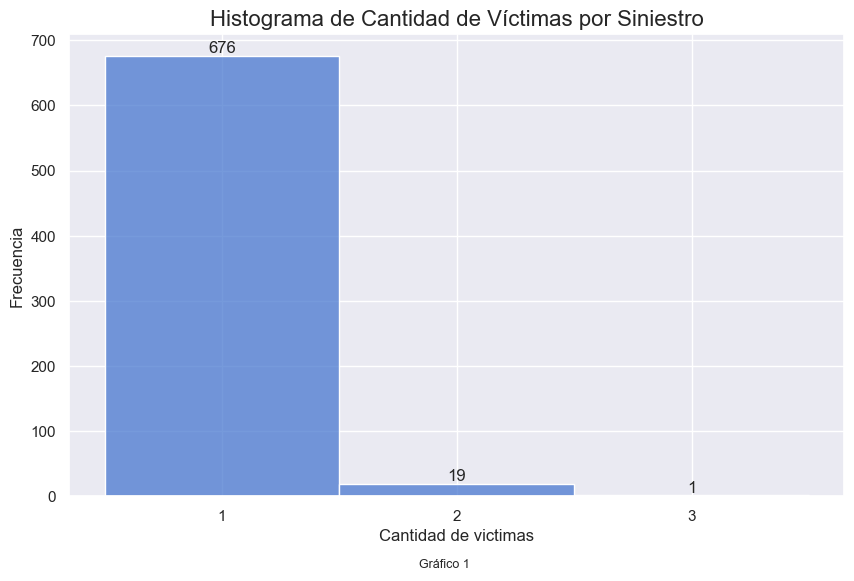

In [137]:
# Distribución de número de víctimas
bins = [0.5, 1.5, 2.5, 3.5]
plt.figure(figsize=(10, 6))
ax = sns.histplot(df_hechos['Cantidad de victimas'],bins = bins, discrete=True)
plt.title('Histograma de Cantidad de Víctimas por Siniestro', fontsize=16)
plt.xlabel('Cantidad de victimas', fontsize=12)
plt.ylabel('Frecuencia', fontsize=12)
plt.figtext( 0.5, -0.01,"Gráfico 1", wrap=True, horizontalalignment='center', fontsize=9)
ax.bar_label(ax.containers[0], fmt='%d', fontsize=12)
plt.xticks([1, 2, 3])
plt.grid(True)
plt.show() 

#### Gráfico 2: Cantidad de Víctimas por Año.
- El año con más cantidad de víctimas registrdas fue el 2018.
- Se nota un descenso de la cantidad de víctimas a partir del año 2019. Es probable que se hayan tomado medidas para disminuir la los Siniestros Viales. 
- Es probable que la disminución del año 2020 haya estado influenciada por la Pandemia.

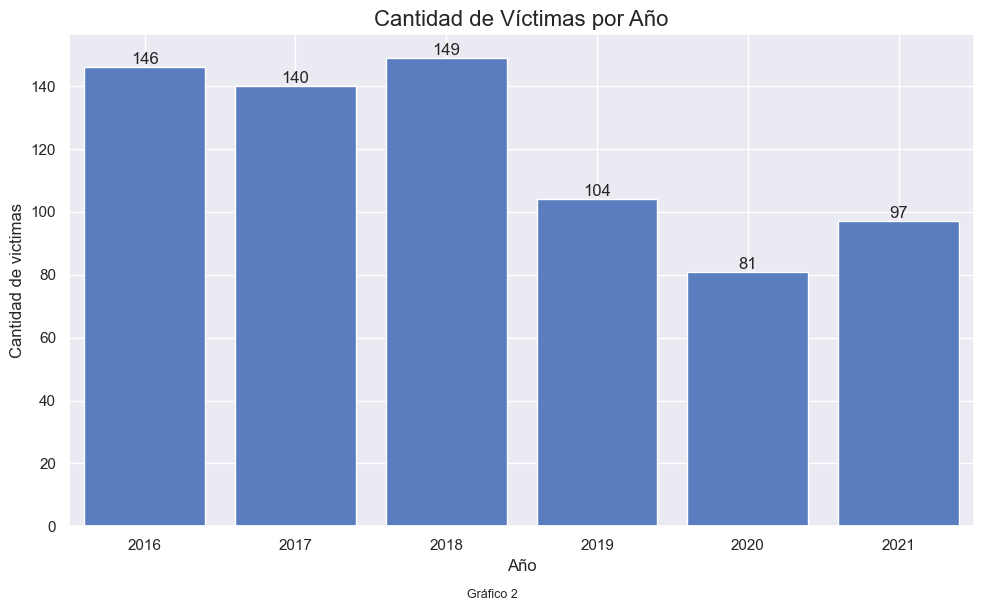

In [138]:
# Cantidad de Víctimas por año
victimas_por_año = df_hechos.groupby('Año')['Cantidad de victimas'].sum().reset_index()
plt.figure(figsize=(10, 6))
ax = sns.barplot(x='Año', y='Cantidad de victimas', data=victimas_por_año)
plt.title('Cantidad de Víctimas por Año', fontsize=16)
plt.xlabel('Año', fontsize=12)
plt.ylabel('Cantidad de victimas', fontsize=12)
plt.figtext( 0.5, -0.01,"Gráfico 2", wrap=True, horizontalalignment='center', fontsize=9)
ax.bar_label(ax.containers[0], fmt='%d', fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.show() 

#### Gráfico 3: Cantidad de Víctimas por Mes.
- Se observa que el mes de Diciembre presenta muchas víctimas.
- Podría estar asociado a la época de las Fiestas de fin de año.

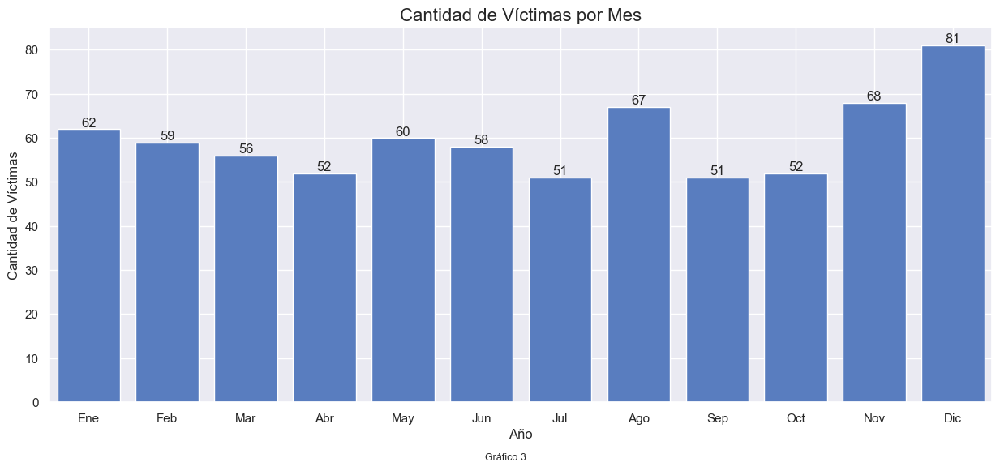

In [139]:
# Cantidad de Víctimas por Mes
victimas_por_mes = df_hechos.groupby(['Mes'])['Cantidad de victimas'].sum().reset_index()
plt.figure(figsize=(15, 6))
ax = sns.barplot(x='Mes', y='Cantidad de victimas', data=victimas_por_mes)
plt.title('Cantidad de Víctimas por Mes', fontsize=16)
plt.xlabel('Año', fontsize=12)
plt.ylabel('Cantidad de Víctimas', fontsize=12)
plt.figtext( 0.5, -0.01,"Gráfico 3", wrap=True, horizontalalignment='center', fontsize=9)
ax.bar_label(ax.containers[0], fmt='%d', fontsize=12)
plt.xticks(ticks=range(0, 12), labels=[
    'Ene', 'Feb', 'Mar', 'Abr', 'May', 'Jun', 
    'Jul', 'Ago', 'Sep', 'Oct', 'Nov', 'Dic'])
plt.grid(True)
plt.show() 

#### Gráfico 4: Serie temporal de Cantidad de Víctimas por Año y Mes.
- Se verifica la reducción de víctimas durante el período marzo/junio 2020 durante la Pandemia.
- Se observa un gran incremento en diciembre 2020 lo que considerarse un outlier.
- Si se realiza un análisis social, el encierro podría haber producido que durante la liberación antes las fiestas de fin de año, las personas hayan tenido comportamientos más riesgosos lo que haya conducido a un incremento en las víctimas fatales por accidentes de tránsito.

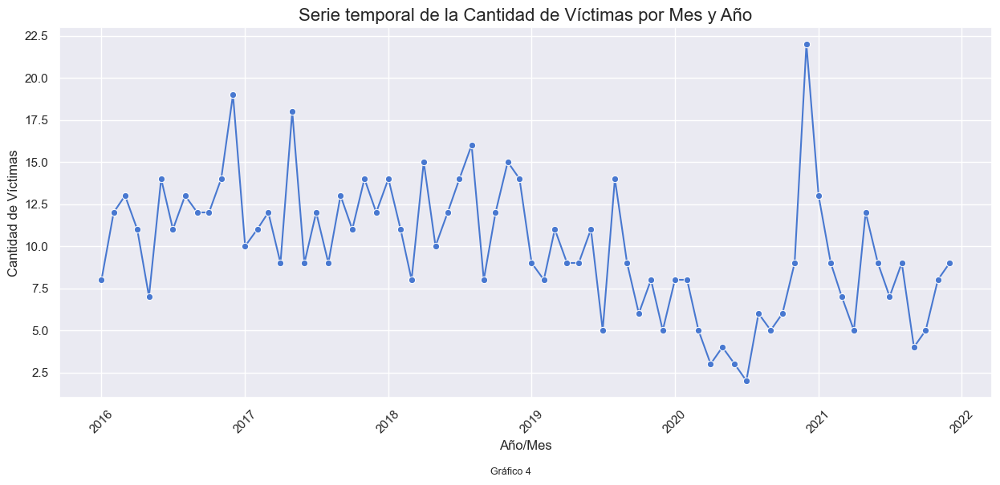

In [140]:
# Cantidad de Víctimas por Año/Mes
victimas_por_anio_mes = df_hechos.groupby(['Año', 'Mes'])['Cantidad de victimas'].sum().reset_index()
victimas_por_anio_mes['Fecha'] = pd.to_datetime(victimas_por_anio_mes['Año'].astype(str) + '-' + victimas_por_anio_mes['Mes'].astype(str))

plt.figure(figsize=(15, 6))
ax = sns.lineplot(x='Fecha', y='Cantidad de victimas', data=victimas_por_anio_mes, marker='o')
plt.title('Serie temporal de la Cantidad de Víctimas por Mes y Año', fontsize=16)
plt.xlabel('Año/Mes', fontsize=12)
plt.ylabel('Cantidad de Víctimas', fontsize=12)
plt.figtext( 0.5, -0.05,"Gráfico 4", wrap=True, horizontalalignment='center', fontsize=9)
plt.xticks(rotation=45)
plt.grid(True)
plt.show() 

#### Gráfico 5: Comparación de Cantidad de Víctimas mensual por Año.
- Se verifica que el año 2020 (en violeta), presentó una gran reducción de víctimas por pandemia y un pico en diciembre por motivos desconocidos.
- Se procede a realizar los siguientes análisis sin considerar el año 2020.

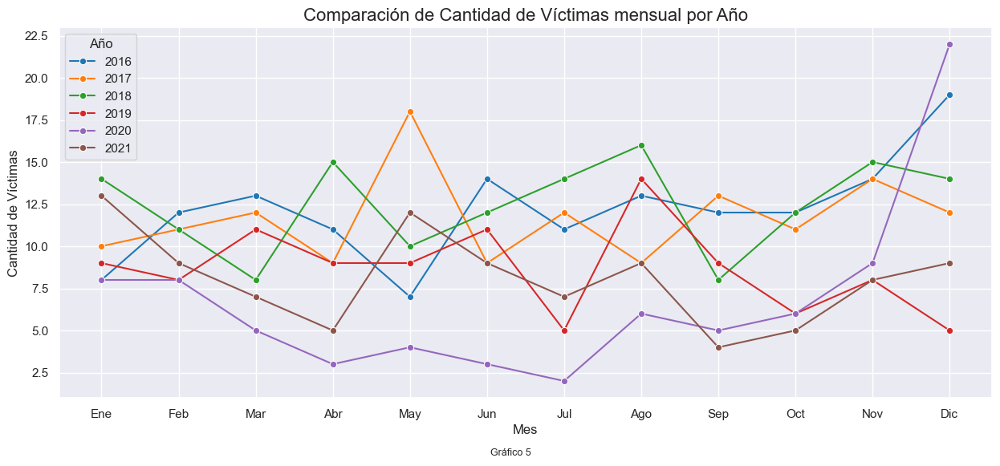

In [141]:
# Cantidad de Víctimas por Año/Mes
victimas_por_mes = df_hechos.groupby(['Año', 'Mes'])['Cantidad de victimas'].sum().reset_index()

plt.figure(figsize=(15, 6))
palette = sns.color_palette("tab10", n_colors=victimas_por_mes['Año'].nunique())
sns.lineplot(data=victimas_por_mes, x='Mes', y='Cantidad de victimas', hue='Año', marker='o', palette=palette)
plt.title('Comparación de Cantidad de Víctimas mensual por Año', fontsize=16)
plt.xlabel('Mes', fontsize=12)
plt.ylabel('Cantidad de Víctimas', fontsize=12)
plt.figtext( 0.5, -0.01,"Gráfico 5", wrap=True, horizontalalignment='center', fontsize=9)
plt.xticks(ticks=range(1, 13), labels=[
    'Ene', 'Feb', 'Mar', 'Abr', 'May', 'Jun', 
    'Jul', 'Ago', 'Sep', 'Oct', 'Nov', 'Dic'])
plt.grid(True)
plt.show() 

#### Gráfico 6: Cantidad de Víctimas por Mes (sin incluir el año 2020)
- Se grafica nuevamente pero sin considerar las víctimas del año 2020 para corroborar si diciembre sigue siendo un mes con elevada cantidad de víctimas.
- Diciembre presenta valores normales y no se visualizan meses con mayor concentración de víctimas.
- Se descarta la hipótesis de que el mes de diciembre pudiera estar influenciado por las fiestas.

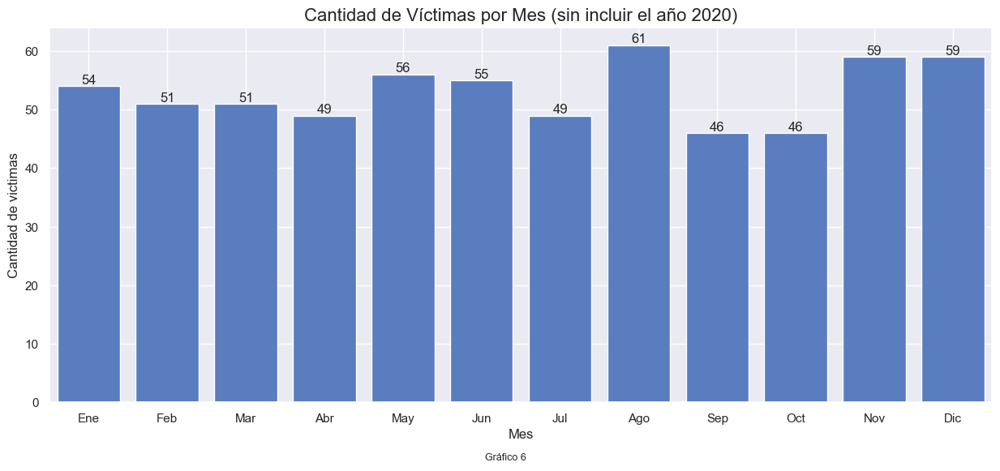

In [142]:
# Cantidad de Víctimas por mes Sin considerar 2020
df_sin_2020 = df_hechos[df_hechos['Año'] != 2020]
victimas_por_mes = df_sin_2020.groupby(['Mes'])['Cantidad de victimas'].sum().reset_index()
plt.figure(figsize=(15, 6))
ax = sns.barplot(x='Mes', y='Cantidad de victimas', data=victimas_por_mes)
plt.title('Cantidad de Víctimas por Mes (sin incluir el año 2020)', fontsize=16)
plt.xlabel('Mes', fontsize=12)
plt.ylabel('Cantidad de victimas', fontsize=12)
plt.figtext( 0.5, -0.01,"Gráfico 6", wrap=True, horizontalalignment='center', fontsize=9)
plt.xticks(ticks=range(0, 12), labels=[
    'Ene', 'Feb', 'Mar', 'Abr', 'May', 'Jun', 
    'Jul', 'Ago', 'Sep', 'Oct', 'Nov', 'Dic'])
ax.bar_label(ax.containers[0], fmt='%d', fontsize=12)
plt.grid(True)
plt.show() 

#### Gráfico 7: Cantidad de Víctimas por Día de la Semana (sin incluir el año 2020)
- No se observan días de la semana que muestren incrementos significativos en la cantidad de víctimas.

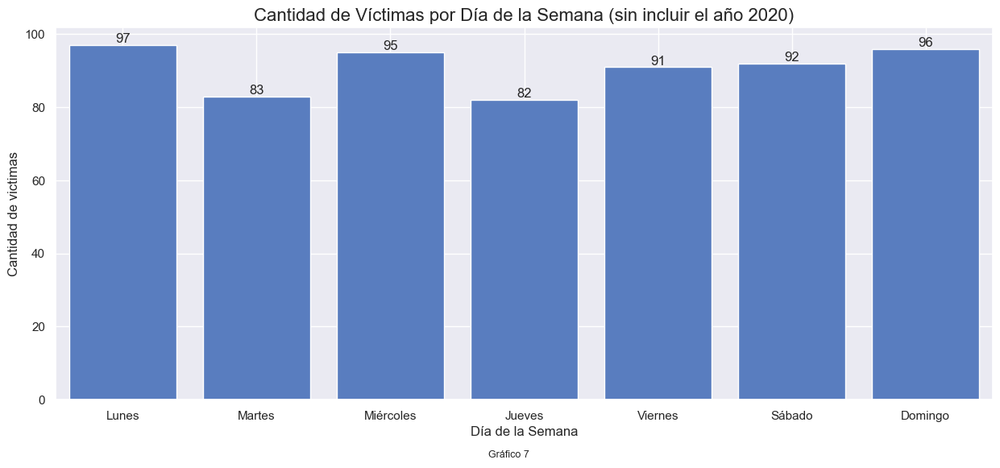

In [143]:
# Cantidad de Víctimas por mes Sin considerar 2020
df_sin_2020 = df_hechos[df_hechos['Año'] != 2020]
victimas_por_dia = df_sin_2020.groupby(['Día de la semana'])['Cantidad de victimas'].sum().reset_index()
dias_ordenados = ['Lunes', 'Martes', 'Miércoles', 'Jueves', 'Viernes', 'Sábado', 'Domingo']
victimas_por_dia['Día de la semana'] = pd.Categorical(victimas_por_dia['Día de la semana'], categories=dias_ordenados, ordered=True)
victimas_por_dia = victimas_por_dia.sort_values('Día de la semana')

plt.figure(figsize=(15, 6))
ax = sns.barplot(x='Día de la semana', y='Cantidad de victimas', data=victimas_por_dia)
plt.title('Cantidad de Víctimas por Día de la Semana (sin incluir el año 2020)', fontsize=16)
plt.xlabel('Día de la Semana', fontsize=12)
plt.ylabel('Cantidad de victimas', fontsize=12)
plt.figtext( 0.5, -0.01,"Gráfico 7", wrap=True, horizontalalignment='center', fontsize=9)
ax.bar_label(ax.containers[0], fmt='%d', fontsize=12)
plt.grid(True)
plt.show() 

#### Gráfico 8: Cantidad de Víctimas por Hora del Día (sin incluir el año 2020)
- Se observa que existe un incremento relativo entre las 05 y 09 horas.

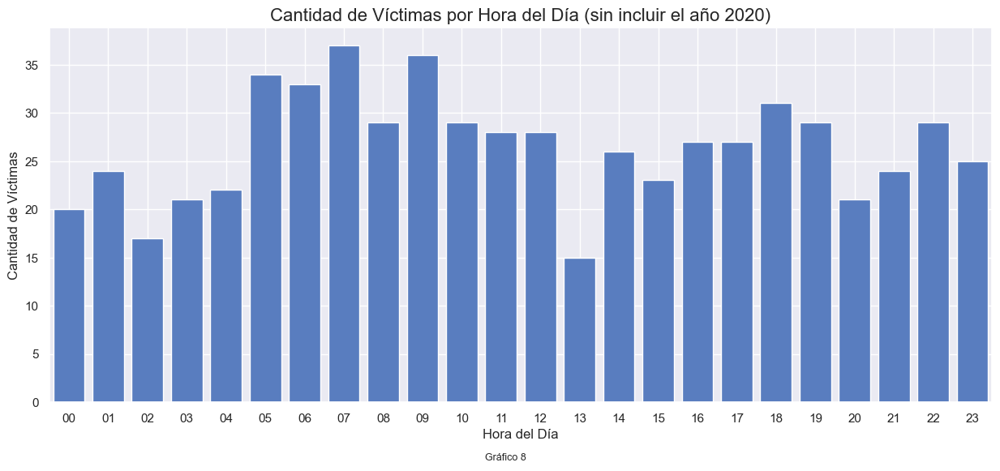

In [144]:
# Cantidad de Víctimas por hora del día Sin considerar 2020
df_sin_2020 = df_hechos[df_hechos['Año'] != 2020]
victimas_por_hora = df_sin_2020.groupby(['HH'])['Cantidad de victimas'].sum().reset_index()
victimas_por_hora = victimas_por_hora.sort_values('HH')

plt.figure(figsize=(15, 6))
ax = sns.barplot(x='HH', y='Cantidad de victimas', data=victimas_por_hora)
plt.title('Cantidad de Víctimas por Hora del Día (sin incluir el año 2020)', fontsize=16)
plt.xlabel('Hora del Día', fontsize=12)
plt.ylabel('Cantidad de Víctimas', fontsize=12)
plt.figtext( 0.5, -0.01,"Gráfico 8", wrap=True, horizontalalignment='center', fontsize=9)
ax.set_xticklabels([f'{int(hh):02}' for hh in victimas_por_hora['HH']])
plt.grid(True)
plt.show() 

#### Gráfico 9: Cantidad de Víctimas por Hora del Día en días Laborales (sin incluir el año 2020)
- En días laborables, entre los rangos horarios de 07 a 11 horas y de 14 a 18 horas, se produce un aumento del promedio de víctimas.

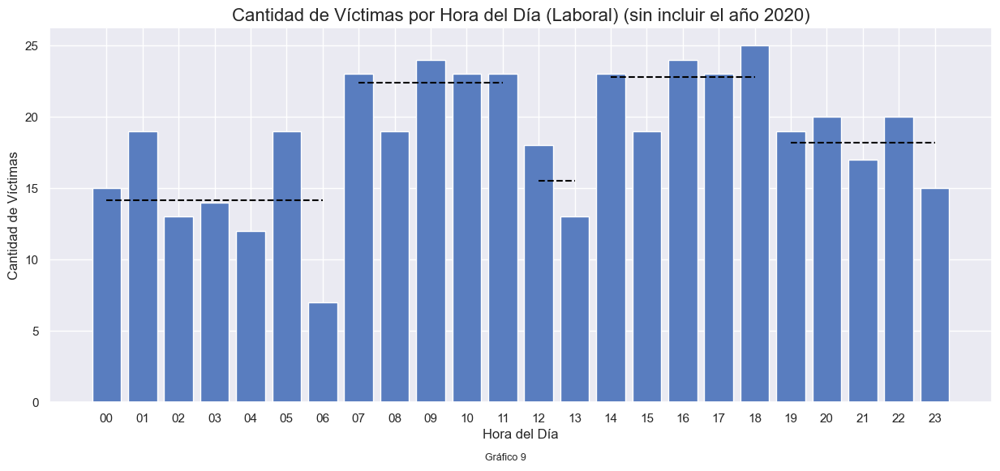

In [145]:
# Cantidad de Víctimas por hora del día (día Laboral) Sin considerar 2020
df_sin_2020 = df_hechos[(df_hechos['Año'] != 2020) & (df_hechos['Tipo de día'] == 'Laboral')]
victimas_por_hora = df_sin_2020.groupby(['HH'])['Cantidad de victimas'].sum().reset_index()

rango_horas = {
    '00-06': victimas_por_hora[(victimas_por_hora['HH'] >= 0) & (victimas_por_hora['HH'] <= 6)],
    '07-11': victimas_por_hora[(victimas_por_hora['HH'] >= 7) & (victimas_por_hora['HH'] <= 11)],
    '12-13': victimas_por_hora[(victimas_por_hora['HH'] >= 12) & (victimas_por_hora['HH'] <= 13)],
    '14-18': victimas_por_hora[(victimas_por_hora['HH'] >= 14) & (victimas_por_hora['HH'] <= 18)],
    '19-23': victimas_por_hora[(victimas_por_hora['HH'] >= 19) & (victimas_por_hora['HH'] <= 23)]
}

promedios = {rango: data['Cantidad de victimas'].mean() if not data.empty else 0 for rango, data in rango_horas.items()}

victimas_por_hora = victimas_por_hora.sort_values('HH')

plt.figure(figsize=(15, 6))
ax = sns.barplot(x='HH', y='Cantidad de victimas', data=victimas_por_hora)
plt.title('Cantidad de Víctimas por Hora del Día (Laboral) (sin incluir el año 2020)', fontsize=16)
plt.xlabel('Hora del Día', fontsize=12)
plt.ylabel('Cantidad de Víctimas', fontsize=12)
plt.figtext( 0.5, -0.01,"Gráfico 9", wrap=True, horizontalalignment='center', fontsize=9)
ax.set_xticklabels([f'{int(hh):02}' for hh in victimas_por_hora['HH']])
plt.grid(True)

for rango, promedio in promedios.items():
    if rango == '00-06':
        x_pos = [0, 1, 2, 3, 4, 5, 6]
    elif rango == '07-11':
        x_pos = [7, 8, 9, 10, 11]
    elif rango == '12-13':
        x_pos = [12, 13]
    elif rango == '14-18':
        x_pos = [14, 15, 16, 17, 18]
    elif rango == '19-23':
        x_pos = [19, 20, 21, 22, 23]
    plt.hlines(y=promedio, xmin=min(x_pos), xmax=max(x_pos), color='black', linestyles='dashed', label=f'Promedio {rango}: {promedio:.2f}')

plt.show()

#### Gráfico 10: Cantidad de Víctimas por Hora del Día en días No Laborales(sin incluir el año 2020)
- En  fines de semana, el promedio se incrementa entre las 05 y 07 horas, luego hay un leve incremento a las 12, a las 19 y finalmente vuelve a subir en el rango de 21 a 23.
- El incremento del promedio de víctimas entre las 05 y 07 horas podría estar asociado a víctimas por excesos durante el retorno de fiestas. 

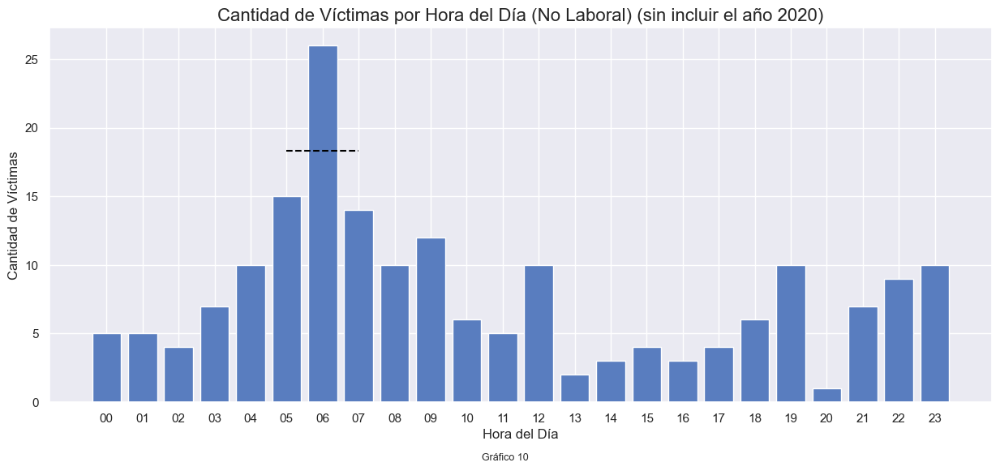

In [146]:
# Cantidad de Víctimas por hora del día (Fin de semana) Sin considerar 2020
df_sin_2020 = df_hechos[(df_hechos['Año'] != 2020) & (df_hechos['Tipo de día']=='No Laboral') ]
victimas_por_hora = df_sin_2020.groupby(['HH'])['Cantidad de victimas'].sum().reset_index()

rango_horas = {
    '05-07': victimas_por_hora[(victimas_por_hora['HH'] >= 5) & (victimas_por_hora['HH'] <= 7)]
}

promedios = {rango: data['Cantidad de victimas'].mean() if not data.empty else 0 for rango, data in rango_horas.items()}

victimas_por_hora = victimas_por_hora.sort_values('HH')

plt.figure(figsize=(15, 6))
ax = sns.barplot(x='HH', y='Cantidad de victimas', data=victimas_por_hora)
plt.title('Cantidad de Víctimas por Hora del Día (No Laboral) (sin incluir el año 2020)', fontsize=16)
plt.xlabel('Hora del Día', fontsize=12)
plt.ylabel('Cantidad de Víctimas', fontsize=12)
plt.figtext( 0.5, -0.01,"Gráfico 10", wrap=True, horizontalalignment='center', fontsize=9)
ax.set_xticklabels([f'{int(hh):02}' for hh in victimas_por_hora['HH']])
plt.grid(True)

promedio = promedios['05-07']
plt.hlines(y=promedio, xmin=5, xmax=7, color='black', linestyles='dashed', label=f'Promedio 05-07: {promedio:.2f}')

plt.show()

####  Gráfico 11: Cantidad de Víctimas por Edad
- Se observa que la mayoría de víctimas tienen entre 20 y 40 años
- Entre 70 y 80 años se vuelve a dar un máximo ralativo.
- Se observan pocas víctimas infantiles.
- Se analizará posteriormente la cantidad de víctimas por rango etario por horario del día durante días laborables y fines de semana.

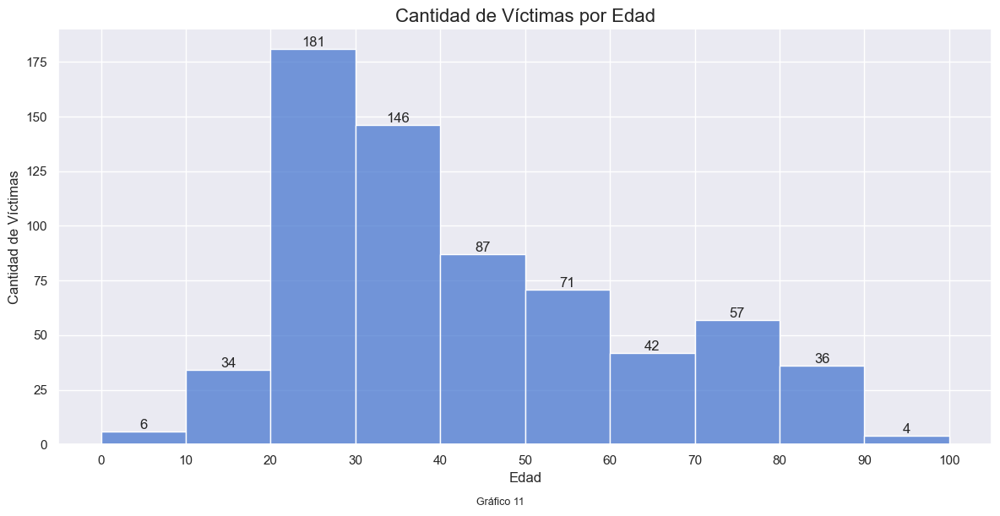

In [147]:
# Cantidad de víctimas por Edad

edad_máxima =  df_victimas['Edad'].max()
bins = np.arange(0, edad_máxima + 10, 10) 

plt.figure(figsize=(12, 6))
ax = sns.histplot(df_victimas['Edad'], bins = bins)
plt.title('Cantidad de Víctimas por Edad', fontsize=16)
plt.xlabel('Edad', fontsize=12)
plt.ylabel('Cantidad de Víctimas', fontsize=12)
plt.figtext( 0.5, -0.01,"Gráfico 11", wrap=True, horizontalalignment='center', fontsize=9)
ax.bar_label(ax.containers[0], fmt='%d', fontsize=12)
plt.xticks(bins)
plt.grid(True)
plt.tight_layout()
plt.show() 

#### Gráfico 12: Cantidad de víctimas por Sexo
- Se observa que el 76.7% de las víctimas son del sexo Masculino.

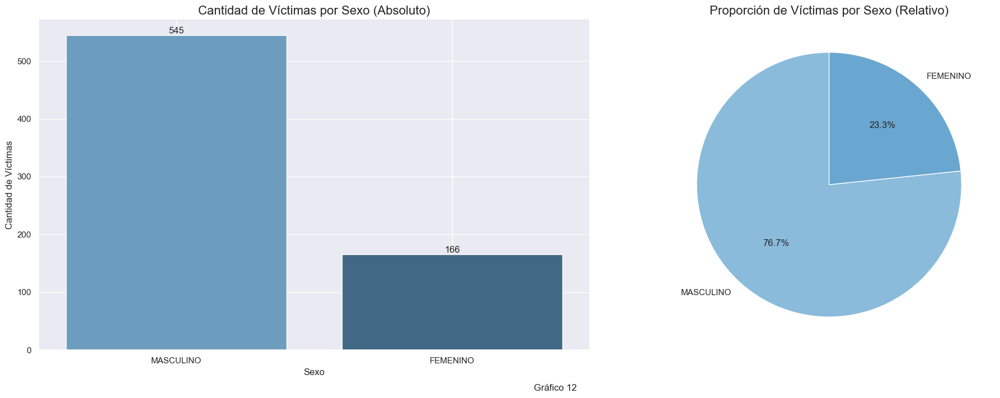

In [148]:
# Cantidad de víctimas por sexo
frecuencias_absolutas = df_victimas['Sexo'].value_counts()
frecuencias_relativas = df_victimas['Sexo'].value_counts(normalize=True) * 100

plt.figure(figsize=(20, 7))

# Primer gráfico: Cantidad absoluta de víctimas por sexo
plt.subplot(1, 2, 1)
ax1 = sns.barplot(x=frecuencias_absolutas.index, y=frecuencias_absolutas, palette='Blues_d')
plt.title('Cantidad de Víctimas por Sexo (Absoluto)', fontsize=16)
plt.ylabel('Cantidad de Víctimas', fontsize=12)
plt.xlabel('Sexo', fontsize=12)
for i in ax1.containers:
    ax1.bar_label(i, fmt='%d', fontsize=12)
plt.grid(True)

# Segundo gráfico: Proporción de víctimas por sexo
plt.subplot(1, 2, 2)
plt.pie(frecuencias_relativas, labels=frecuencias_relativas.index, autopct='%.1f%%', colors=sns.color_palette('Blues_d'), startangle=90, wedgeprops={'edgecolor': 'white'})
plt.title('Proporción de Víctimas por Sexo (Relativo)', fontsize=16)

plt.figtext( 0.5, -0.01,"Gráfico 12", wrap=True, horizontalalignment='center', fontsize=12)

plt.tight_layout()
plt.show()

#### Gráfico 13: Cantidad de Víctimas por Tipo de Calle
- Los resultados muestran que el tránsito dentro de la ciudad (Avenidas y Calles) genera mayor cantidad de víctimas que el tránsito por Autopistas o por la General Paz (la cual también tiene el comportamiento de una autopista). Las medidas deberán estar enfocadas a reducir los accidentes en este tipo de arterias.

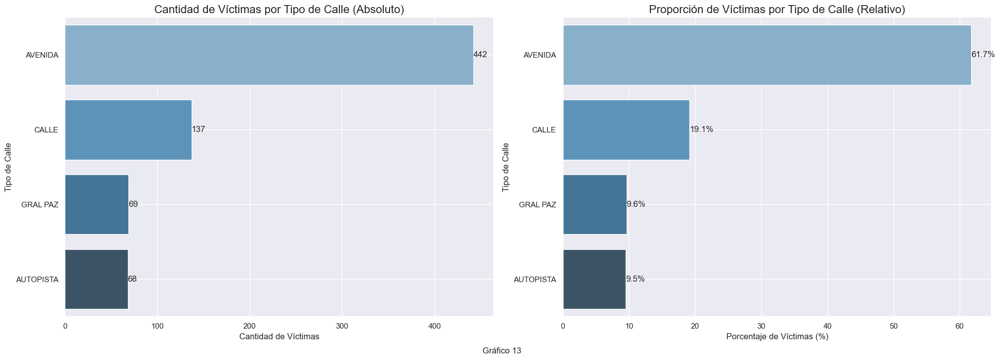

In [149]:
# Cantidad de víctimas po Tipo de Calle
victimas_por_tipo_calle = df_hechos.groupby('Tipo de calle')['Cantidad de victimas'].sum().reset_index()
victimas_por_tipo_calle = victimas_por_tipo_calle.sort_values('Cantidad de victimas', ascending=False)
victimas_por_tipo_calle['Porcentaje'] = (victimas_por_tipo_calle['Cantidad de victimas'] / victimas_por_tipo_calle['Cantidad de victimas'].sum()) * 100

plt.figure(figsize=(20, 7))

# Primer gráfico: Cantidad absoluta de víctimas por tipo de calle
plt.subplot(1, 2, 1)
ax1 = sns.barplot(x='Cantidad de victimas', y='Tipo de calle', data=victimas_por_tipo_calle, palette='Blues_d')
plt.title('Cantidad de Víctimas por Tipo de Calle (Absoluto)', fontsize=16)
plt.xlabel('Cantidad de Víctimas', fontsize=12)
plt.ylabel('Tipo de Calle', fontsize=12)
for i in ax1.containers:
    ax1.bar_label(i, fmt='%d', fontsize=12)
plt.grid(True)

# Segundo gráfico: Proporción de víctimas por tipo de calle
plt.subplot(1, 2, 2)
ax2 = sns.barplot(x='Porcentaje', y='Tipo de calle', data=victimas_por_tipo_calle, palette='Blues_d')
plt.title('Proporción de Víctimas por Tipo de Calle (Relativo)', fontsize=16)
plt.xlabel('Porcentaje de Víctimas (%)', fontsize=12)
plt.ylabel('Tipo de Calle', fontsize=12)
for i in ax2.containers:
    ax2.bar_label(i, fmt='%.1f%%', fontsize=12)
plt.grid(True)

plt.figtext( 0.5, -0.01,"Gráfico 13", wrap=True, horizontalalignment='center', fontsize=12)

plt.tight_layout()
plt.show()

#### Gráfico 14: Cantidad de Víctimas por Tipo de Cruce
- Se identifica que la mayoría de los siniestros ocurren en Intersecciones

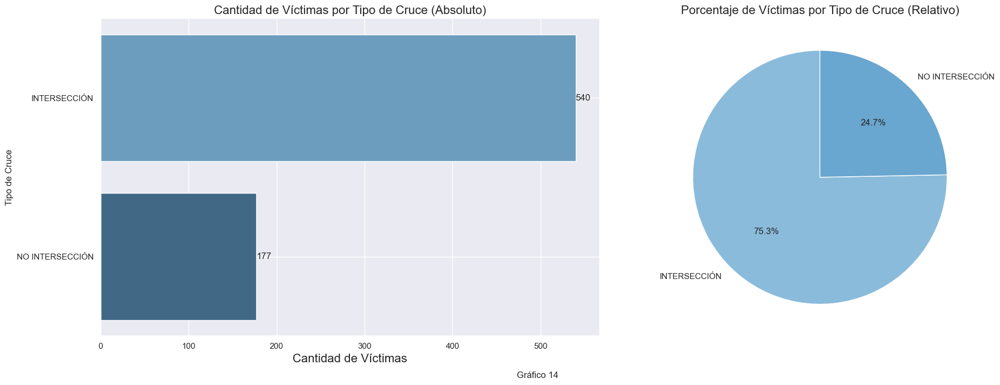

In [150]:
# Cantidad de víctimas po Tipo de Cruce
victimas_por_tipo_cruce = df_hechos.groupby('Tipo de cruce')['Cantidad de victimas'].sum().reset_index()
victimas_por_tipo_cruce = victimas_por_tipo_cruce.sort_values('Cantidad de victimas', ascending=False)
victimas_por_tipo_cruce['Porcentaje'] = (victimas_por_tipo_cruce['Cantidad de victimas'] / victimas_por_tipo_cruce['Cantidad de victimas'].sum()) * 100

plt.figure(figsize=(20, 7))

# Primer gráfico: Cantidad absoluta de víctimas por tipo de cruce
plt.subplot(1, 2, 1)
ax1 = sns.barplot(x='Cantidad de victimas', y='Tipo de cruce', data=victimas_por_tipo_cruce, palette='Blues_d')
plt.title('Cantidad de Víctimas por Tipo de Cruce (Absoluto)', fontsize=16)
plt.xlabel('Cantidad de Víctimas', fontsize=16)
plt.ylabel('Tipo de Cruce', fontsize=12)
for i in ax1.containers:
    ax1.bar_label(i, fmt='%d', fontsize=12)
plt.grid(True)

# Segundo gráfico: Frecuencia relativa de víctimas por tipo de cruce
plt.subplot(1, 2, 2)
plt.pie(victimas_por_tipo_cruce['Porcentaje'], labels=victimas_por_tipo_cruce['Tipo de cruce'], autopct='%.1f%%', colors=sns.color_palette('Blues_d'), startangle=90, wedgeprops={'edgecolor': 'white'})
plt.title('Porcentaje de Víctimas por Tipo de Cruce (Relativo)', fontsize=16)

plt.figtext( 0.5, -0.01,"Gráfico 14", wrap=True, horizontalalignment='center', fontsize=12)

plt.tight_layout()
plt.show()

#### Gráfico 15: Mapa de calor de Víctimas por accidente de tránsito por Tipo de Cruce y por Comuna
- Se utiliza el Shapefile de: https://data.buenosaires.gob.ar/dataset/comunas/resource/Juqdkmgo-612222-resource
- Como se puede observar en el mapa de calor, la mayoría de las víctimas ocurren en las Comuna 1 y 4, en relación a la zona céntrica de la Ciudad, probablemente la que mayor tráfico tenga. Las medidas podrían focalizarse en estas zonas geográficas.
- En el mapa por puntos se corrobora lo mostrado en el gráfico de accidentes por Tipo de calle, que la mayor cantidad de accidentes suceden en Intersecciones dentro de la ciudad. 

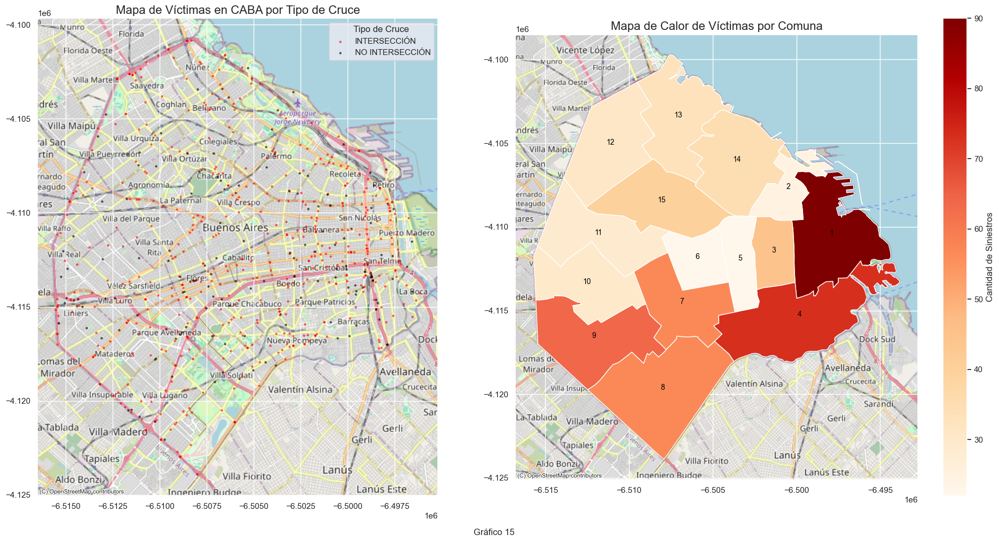

In [151]:
# Convertir las coordenadas a numérico
df_hechos['pos_x'] = pd.to_numeric(df_hechos['Longitud'], errors='coerce')
df_hechos['pos_y'] = pd.to_numeric(df_hechos['Latitud'], errors='coerce')

# Crear un GeoDataFrame con las posiciones
gdf_hechos = gpd.GeoDataFrame(df_hechos, geometry=gpd.points_from_xy(df_hechos['pos_x'], df_hechos['pos_y']), crs="EPSG:4326")

# Definir el sistema de coordenadas y convertir a Web Mercator para contextily
gdf_hechos = gdf_hechos.to_crs(epsg=3857)

# Cargar el shapefile de las comunas de Buenos Aires
comunas = gpd.read_file("..\\_src\\comunas.shp")
comunas = comunas.to_crs(epsg=3857)  # Convertir a la misma proyección EPSG:3857

# Realizar la intersección espacial para contar siniestros por comuna
siniestros_por_comuna = gpd.sjoin(gdf_hechos, comunas, predicate='within').groupby('comuna')['geometry'].count()

# Agregar la información de siniestros al GeoDataFrame de comunas
comunas['siniestros'] = comunas['comuna'].map(siniestros_por_comuna)

# Crear un nuevo campo 'Tipo de Cruce'
condiciones = [
    df_hechos['Tipo de calle'] == 'Autopista',  # Condición para autopistas
    df_hechos['Tipo de cruce'].notna()  # Condición para intersecciones
]

# Resultados según las condiciones
resultados = [
    'AUTOPISTA',         # Si es autopista
    'INTERSECCIÓN'       # Si tiene cruce no nulo
]

# Usar np.select para asignar 'NO INTERSECCIÓN' en los casos que no cumplan las condiciones
gdf_hechos['Tipo de Cruce'] = np.select(condiciones, resultados, default='NO INTERSECCIÓN')

# Definir un diccionario de colores para cada valor de 'Tipo de Cruce'
colores = {'AUTOPISTA': 'blue', 'INTERSECCIÓN': 'red', 'NO INTERSECCIÓN': 'black'}

# Agregar una columna de color al GeoDataFrame según el tipo de cruce
gdf_hechos['color'] = gdf_hechos['Tipo de cruce'].map(colores)

# Instanciar la figura con dos columnas
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(20, 10))

# Primer mapa: puntos de siniestros con distintos colores para cada tipo de cruce
# Graficar los puntos con colores según el tipo de cruce
for tipo, color in colores.items():
    subset = gdf_hechos[gdf_hechos['Tipo de cruce'] == tipo]
    subset.plot(ax=ax1, markersize=5, alpha=0.5, color=color, label=tipo)

# Agregar el mapa base
ctx.add_basemap(ax1, source=ctx.providers.OpenStreetMap.Mapnik)

# Agregar leyenda para los colores
ax1.legend(title='Tipo de Cruce')

# Título del primer gráfico
ax1.set_title('Mapa de Víctimas en CABA por Tipo de Cruce', fontsize=16)

# Segundo mapa: Mapa de calor por comuna
# Crear el mapa de calor con las comunas y la cantidad de siniestros por comuna
comunas.plot(column='siniestros', ax=ax2, legend=True, cmap='OrRd', legend_kwds={'label': "Cantidad de Siniestros"})

# Agregar el mapa base
ctx.add_basemap(ax2, source=ctx.providers.OpenStreetMap.Mapnik)

# Agregar el número de la comuna al mapa
for idx, row in comunas.iterrows():
    centroid = row['geometry'].centroid
    ax2.text(centroid.x, centroid.y, f"{row['comuna']}", ha='center', fontsize=10, color='black')

# Título del segundo gráfico
ax2.set_title('Mapa de Calor de Víctimas por Comuna', fontsize=16)
plt.figtext( 0.5, -0.01,"Gráfico 15", wrap=True, horizontalalignment='center', fontsize=12)

# Mostrar ambos gráficos
plt.tight_layout()
plt.show()


#### Gráfico 16: Cantidad de Víctimas por Tipo de Víctima
- Como se puede observar, la mayor cantidad de víctimas son motociclistas o peatones.

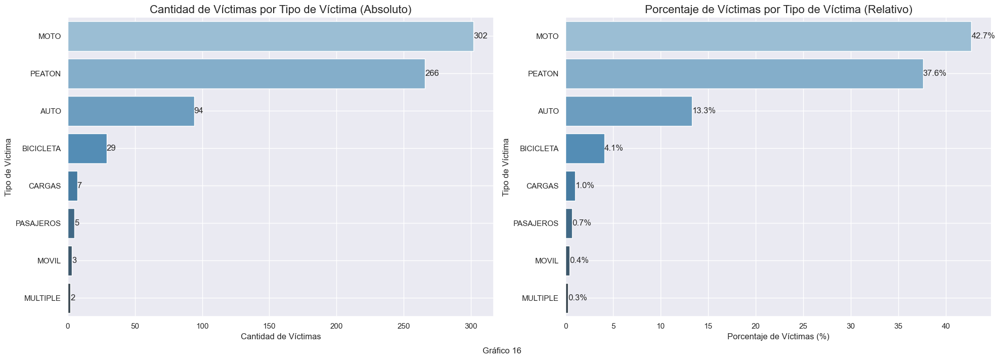

In [152]:
# Cantidad de víctimas por tipo de víctima
victimas_por_tipo_victima = df_hechos.groupby('Victima')['Cantidad de victimas'].sum().reset_index()
victimas_por_tipo_victima = victimas_por_tipo_victima.sort_values('Cantidad de victimas', ascending=False)
victimas_por_tipo_victima['Porcentaje'] = (victimas_por_tipo_victima['Cantidad de victimas'] / victimas_por_tipo_victima['Cantidad de victimas'].sum()) * 100

plt.figure(figsize=(20, 7))

# Primer gráfico: Cantidad absoluta de víctimas por tipo de víctima
plt.subplot(1, 2, 1)
ax1 = sns.barplot(x='Cantidad de victimas', y='Victima', data=victimas_por_tipo_victima, palette='Blues_d')
plt.title('Cantidad de Víctimas por Tipo de Víctima (Absoluto)', fontsize=16)
plt.xlabel('Cantidad de Víctimas', fontsize=12)
plt.ylabel('Tipo de Víctima', fontsize=12)
for i in ax1.containers:
    ax1.bar_label(i, fmt='%d', fontsize=12)
plt.grid(True)

# Segundo gráfico: Frecuencia relativa de víctimas por tipo de víctima
plt.subplot(1, 2, 2)
ax2 = sns.barplot(x='Porcentaje', y='Victima', data=victimas_por_tipo_victima, palette='Blues_d')
plt.title('Porcentaje de Víctimas por Tipo de Víctima (Relativo)', fontsize=16)
plt.xlabel('Porcentaje de Víctimas (%)', fontsize=12)
plt.ylabel('Tipo de Víctima', fontsize=12)
for i in ax2.containers:
    ax2.bar_label(i, fmt='%.1f%%', fontsize=12)
plt.grid(True)

plt.figtext( 0.5, -0.01,"Gráfico 16", wrap=True, horizontalalignment='center', fontsize=12)

plt.tight_layout()
plt.show()

#### Gráfico 17: : Cantidad de Víctimas por Tipo de Acusado
- Como se puede observar, la mayor cantidad de Contrapartes son los Autos, el Transporte Público y los transportes de Carga.

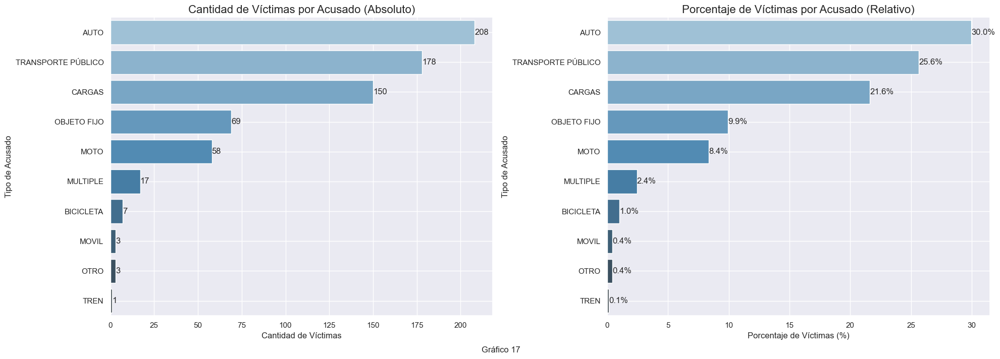

In [153]:
# Cantidad de víctimas por acusado
victimas_por_tipo_acusado = df_hechos.groupby('Acusado')['Cantidad de victimas'].sum().reset_index()
victimas_por_tipo_acusado = victimas_por_tipo_acusado.sort_values('Cantidad de victimas', ascending=False)
victimas_por_tipo_acusado['Porcentaje'] = (victimas_por_tipo_acusado['Cantidad de victimas'] / victimas_por_tipo_acusado['Cantidad de victimas'].sum()) * 100

plt.figure(figsize=(20, 7))

# Primer gráfico: Cantidad absoluta de víctimas por acusado
plt.subplot(1, 2, 1)
ax1 = sns.barplot(x='Cantidad de victimas', y='Acusado', data=victimas_por_tipo_acusado, palette='Blues_d')
plt.title('Cantidad de Víctimas por Acusado (Absoluto)', fontsize=16)
plt.xlabel('Cantidad de Víctimas', fontsize=12)
plt.ylabel('Tipo de Acusado', fontsize=12)
for i in ax1.containers:
    ax1.bar_label(i, fmt='%d', fontsize=12)
plt.grid(True)

# Segundo gráfico: Frecuencia relativa de víctimas por acusado
plt.subplot(1, 2, 2)
ax2 = sns.barplot(x='Porcentaje', y='Acusado', data=victimas_por_tipo_acusado, palette='Blues_d')
plt.title('Porcentaje de Víctimas por Acusado (Relativo)', fontsize=16)
plt.xlabel('Porcentaje de Víctimas (%)', fontsize=12)
plt.ylabel('Tipo de Acusado', fontsize=12)
for i in ax2.containers:
    ax2.bar_label(i, fmt='%.1f%%', fontsize=12)
plt.grid(True)

plt.figtext( 0.5, -0.01,"Gráfico 17", wrap=True, horizontalalignment='center', fontsize=12)


plt.tight_layout()
plt.show()

---
# Análisis Multivariado

#### Gráfico 18: : Heatmap de Víctima vs Acusado
- Se detecta que la mayor cantidad de víctimas son Petones causados por accidentes de tránsito en el medio de Transporte Público.
- En segundo lugar se destaca la cantidad de muertes de Peatones y Motos causadas por accidentes con Autos y por Transportes de Carga.

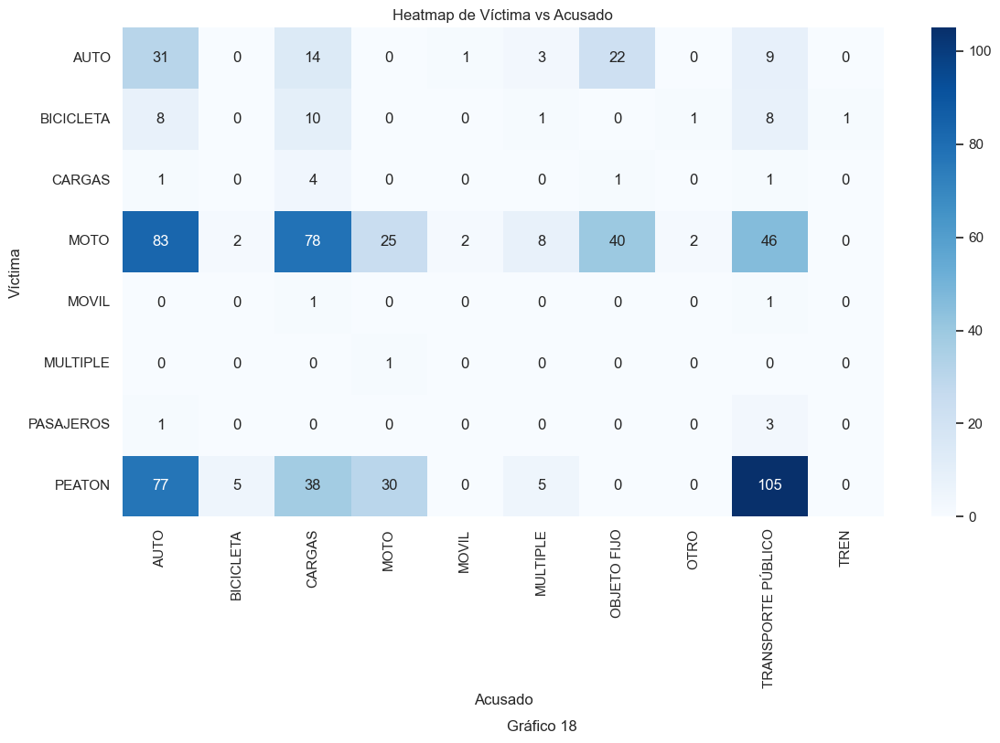

In [154]:
# Heatmap de Víctima vs Acusado
contingency_table = df_hechos.pivot_table(index='Victima', columns='Acusado', values='Cantidad de victimas', aggfunc='count', fill_value=0)

# Crear el gráfico de calor
plt.figure(figsize=(12, 8))
sns.heatmap(contingency_table, annot=True, fmt='d', cmap='Blues')
plt.title('Heatmap de Víctima vs Acusado')
plt.xlabel('Acusado')
plt.ylabel('Víctima')
plt.figtext( 0.5, -0.01,"Gráfico 18", wrap=True, horizontalalignment='center', fontsize=12)

plt.tight_layout()
plt.show()

#### Gráfico 19: : Cantidad de Víctimas por hora del día y Edad (días Laborales) (Sin considerar 2020)
- Se detecta que durante la madrugada las víctimas fatales son en general los grupos etarios entre 20 y 40.

<Figure size 1500x600 with 0 Axes>

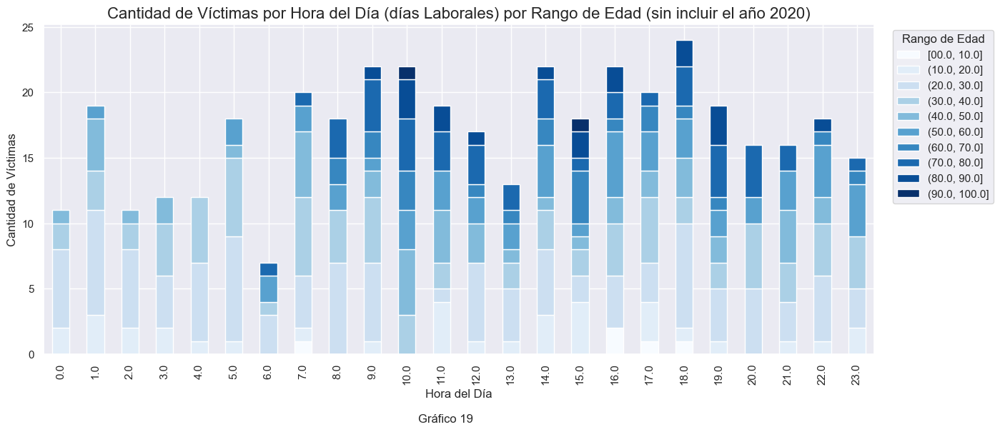

In [155]:
# Cantidad de Víctimas por hora del día y Edad (días Laborales) Sin considerar 2020
df_sin_2020 = df_victimas.merge(df_hechos[['Tipo de día','HH']], left_on='Id', right_on='Id', how='inner')
df_sin_2020 = df_sin_2020[(df_sin_2020['Año'] != 2020) & (df_sin_2020['Tipo de día'] == 'Laboral')]
df_sin_2020 = df_sin_2020.dropna(subset=['Edad'])

edad_máxima =  df_sin_2020['Edad'].max()
bins = np.arange(0, edad_máxima + 10, 10) 

df_sin_2020['Rango de Edad'] = pd.cut(df_sin_2020['Edad'], bins=bins, include_lowest=True)
df_sin_2020['Rango de Edad'] = df_sin_2020['Rango de Edad'].cat.rename_categories(
    {df_sin_2020['Rango de Edad'].cat.categories[0]: '[00.0, 10.0]'})
victimas_por_hora_edad = df_sin_2020.groupby(['HH', 'Rango de Edad']).size().reset_index(name='Cantidad de víctimas')
victimas_pivot = victimas_por_hora_edad.pivot(index='HH', columns='Rango de Edad', values='Cantidad de víctimas').fillna(0)

victimas_por_hora_edad = victimas_por_hora_edad.sort_values('HH')

plt.figure(figsize=(15, 6))
victimas_pivot.plot(kind='bar', stacked=True, colormap='Blues', figsize=(15,6))

plt.title('Cantidad de Víctimas por Hora del Día (días Laborales) por Rango de Edad (sin incluir el año 2020)', fontsize=16)
plt.xlabel('Hora del Día', fontsize=12)
plt.ylabel('Cantidad de Víctimas', fontsize=12)
#ax.set_xticklabels([f'{int(hh):02}' for hh in victimas_por_hora['HH']])
plt.grid(True)
plt.legend(title='Rango de Edad', loc='upper right', bbox_to_anchor=(1.15, 1))
plt.figtext( 0.5, -0.05,"Gráfico 19", wrap=True, horizontalalignment='center', fontsize=12)


plt.show()

#### Gráfico 20: : Cantidad de Víctimas por hora del día y Edad (días No Laborales) (Sin considerar 2020)
- Al igual que en el gráfico anterior, se detecta que durante un incremento de víctimas fatales entre las 05 y 07 horas y de los grupos etarios más jóvenes.

<Figure size 1500x600 with 0 Axes>

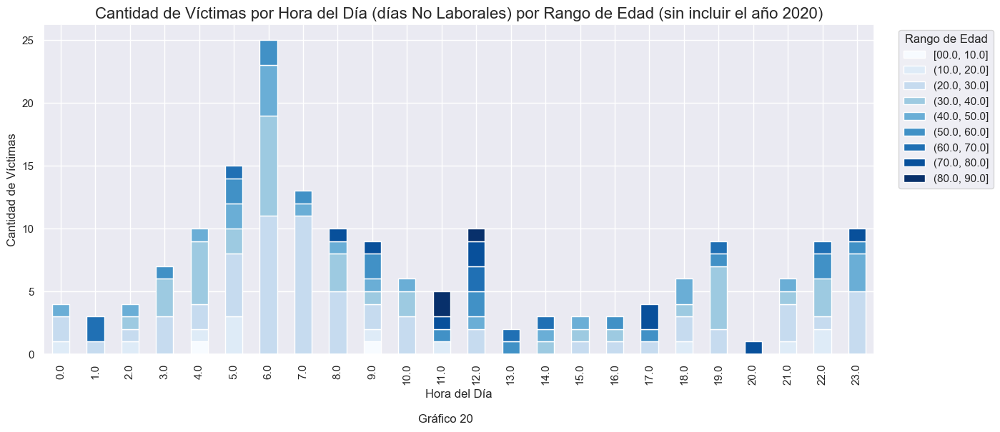

In [156]:
# Cantidad de Víctimas por hora del día y Edad (días No Laborales) Sin considerar 2020
df_sin_2020 = df_victimas.merge(df_hechos[['Tipo de día','HH']], left_on='Id', right_on='Id', how='inner')
df_sin_2020 = df_sin_2020[(df_sin_2020['Año'] != 2020) & (df_sin_2020['Tipo de día'] == 'No Laboral')]
df_sin_2020 = df_sin_2020.dropna(subset=['Edad'])

edad_máxima =  df_sin_2020['Edad'].max()
bins = np.arange(0, edad_máxima + 10, 10) 

df_sin_2020['Rango de Edad'] = pd.cut(df_sin_2020['Edad'], bins=bins, include_lowest=True)
df_sin_2020['Rango de Edad'] = df_sin_2020['Rango de Edad'].cat.rename_categories(
    {df_sin_2020['Rango de Edad'].cat.categories[0]: '[00.0, 10.0]'})
victimas_por_hora_edad = df_sin_2020.groupby(['HH', 'Rango de Edad']).size().reset_index(name='Cantidad de víctimas')
victimas_pivot = victimas_por_hora_edad.pivot(index='HH', columns='Rango de Edad', values='Cantidad de víctimas').fillna(0)

victimas_por_hora_edad = victimas_por_hora_edad.sort_values('HH')

plt.figure(figsize=(15, 6))
victimas_pivot.plot(kind='bar', stacked=True, colormap='Blues', figsize=(15,6))

plt.title('Cantidad de Víctimas por Hora del Día (días No Laborales) por Rango de Edad (sin incluir el año 2020)', fontsize=16)
plt.xlabel('Hora del Día', fontsize=12)
plt.ylabel('Cantidad de Víctimas', fontsize=12)
#ax.set_xticklabels([f'{int(hh):02}' for hh in victimas_por_hora['HH']])
plt.grid(True)
plt.legend(title='Rango de Edad', loc='upper right', bbox_to_anchor=(1.15, 1))
plt.figtext( 0.5, -0.05,"Gráfico 20", wrap=True, horizontalalignment='center', fontsize=12)
plt.show()

#### Gráfico 21: : Boxplot de Edad de las víctimas por Tipo de Víctima
- Se destaca un incremento de la Edad media de las víctimas del tipo Peatón y "Pasajero".

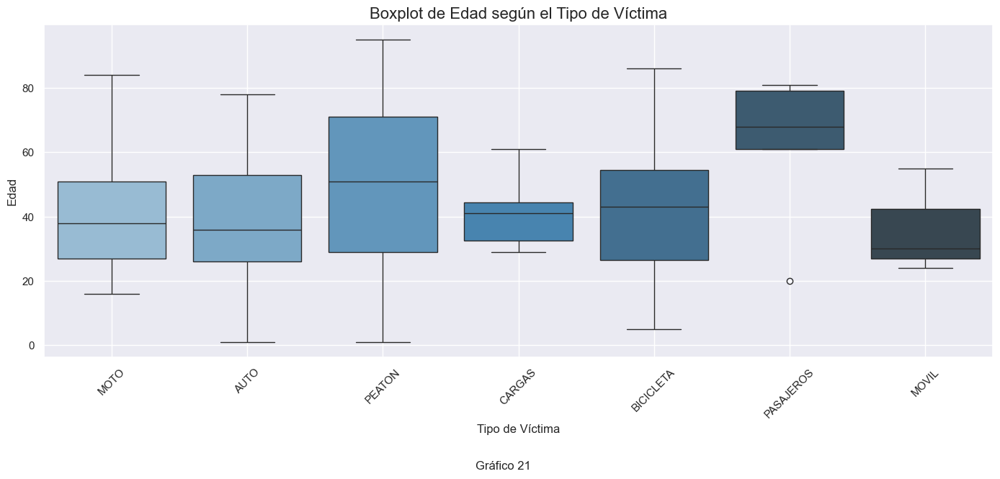

In [157]:
# Boxplot de Edad de las víctimas por tipo de víctima
df_victimas_copy = df_victimas.copy()
df_victimas_copy = df_victimas_copy.dropna(subset=['Victima', 'Edad'])
df_victimas_copy = df_victimas_copy.drop_duplicates(subset=['Victima', 'Edad'])
df_victimas_copy['Edad'] = pd.to_numeric(df_victimas_copy['Edad'], errors='coerce')


# Crear un gráfico de cajas para la Edad según el Tipo de Víctima
plt.figure(figsize=(17, 6))
sns.boxplot(x='Victima', y='Edad', data=df_victimas_copy, palette='Blues_d')
plt.title('Boxplot de Edad según el Tipo de Víctima', fontsize=16)
plt.xlabel('Tipo de Víctima', fontsize=12)
plt.ylabel('Edad', fontsize=12)
plt.xticks(rotation=45)
plt.figtext( 0.5, -0.15,"Gráfico 21", wrap=True, horizontalalignment='center', fontsize=12)
plt.grid(True)
plt.show()